# Evaluation of DMRI DENoising (EDDEN)

- This notebook provides code and indications to reproduce the results in [Manzano-Patron, J.P. et al. (2023) Denoising Diffusion MRI: Considerations and implications for analysis
](https://pubmed.ncbi.nlm.nih.gov/37546835/#:~:text=We%20demonstrate%20that%20all%20tested,the%20method%20and%20the%20implementation.)  
- The EDDEN dataset can be downloaded from the [OpenNeuro repository](). Please, note that some of the derivatives are not contained in the repository and will need to be processed.

**Table of contents**<a id='toc0_'></a>
- [**Setup**](#setup)
- [Fig.Sup.1 - Growth of number of publications](#toc_1_Sup)

- [**Consideration 1 - Denoising should improve raw signal quality by removing noise-related variance**](#toc1_)    
  - [Fig.1 - Qualitative maps](#toc_1_1_)
  - [Fig.2 - Gains in SNR and angular-CNR (whole brain)](#toc1_2_)    
  - [Suppl.Fig.2 - Gains in SNR and angular-CNR (WM)](#toc1_3_)  
  - [Fig.3 - Spherical Harmonics Power Spectra (GM)](#toc1_4_)  
  - [Suppl.Fig.3 - Spherical Harmonics Power Spectra (WM)](#toc1_5_)  
  - [Suppl.Fig.4 - Spatial maps of differences in Spherical Harmonics Power Spectra in magnitude- and complex-denoising](#toc1_6_) 
  - [Suppl.Fig.5 - Spatial maps of Spherical Harmonics Power Spectra](#toc1_7_) 

- [**Consideration 2 - Denoising should preserve the expected statistical distribution properties of the dMRI signal and remove biases introduced by the noise-floor**](#toc2_)     
  - [Fig.4 - Difference maps](#toc2_1_)    
  - [Fig.5.A - Noise distributions](#toc2_2_)   
  - [Fig.5.B - Signal rectification](#toc2_3_)  
  - [Suppl.Fig.6 - Signal rectification (with AVG signals)](#toc2_4_) 

- [**Consideration 3 - Denoising should increase the similarity of a dataset against a low-noise gold standard, such as the average of multiple repeats**](#toc3_)    

- [**Consideration 4 - Denoising should preserve the spatial resolution of the original data**](#toc4_) 
  - [Fig.6 - Estimated voxel resolution using DTI residuals](#toc4_1_) 
  - [Suppl.Fig.7 - Estimated voxel resolution using DKI residuals](#toc4_2_) 
  - [Fig.Extra(I - Validity of residuals assumption](#toc4_3_)
  - [Table 1 - Spatial resolution loss](#toc4_4_) 
  - [Fig.7 - Patch size effect in the loss of resolution](#toc4_5_)
  - [Fig.8 - Patch size effect in the SNR/CNR gains](#toc4_6_)
  - [Fig.Extra(I) - Patch size effect in the noise floor](#toc4_7_)
  - [Suppl.Fig.8 - Patch size effect in NLM denoised data](#toc4_3_) 

- [**Consideration 5 - Denoising should provide gains in model parameter estimation for both precision and accuracy**](#toc5_) 
  - [Fig.9A - Accuracy of DTI estimates](#toc5_1_)
  - [Fig.9B - Precision of DTI estimates](#toc5_2_)

- [**Consideration 6 - Denoising should not be detrimental to subsequent processing and performance should converge at the high SNR limit**](#toc6_) 
  - [Fig.10A - Convergence of signal gains at high SNR](#toc6_1_)
  - [Fig.10B - Convergence of tractography performance at high SNR](#toc6_2_)

- [**Consideration 7 - Denoising should be transformative in allowing SNR-limited applications that are otherwise infeasible (e.g.at ultra-high spatial resolution**](#toc7_) 
  - [Fig.11B - Rate of crossing-fibres detected in the Centrum Semiovale](#toc7_1_)
  - [Fig.11C - First fibre uncertainty in the Corpus Callosum](#toc7_2_)
  - [Fig.13 - Qualitative FA maps comparisons](#toc7_3_)
  - [Fig.14 - Convergence of subsets of denoised data to the AVG*](#toc7_4_)
  - [Suppl.Fig.9 - Convergence of subsets of denoised data to the |AVG|](#toc7_5_)
  
<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

## <a id='setup'></a>[**Setup the environment**](#setup)

To reproduce all the results shown in the paper, data must be denoise and pre-process in the following manner:

data.nii.gz is without the PA (correct bvals and bvecs accordingly)


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import nibabel as nb
from scipy import ndimage, stats
from scipy.stats import ranksums
import os 
import subprocess
from pathlib import Path
import warnings
import sys

sys.path.append('new_code')  # Add the 'new_code' subfolder to the system path
from new_code.utils import get_data, export_nifti, read_residuals, make_plotgrid, set_axis_style, rearrange_signal, smooth, localize_highFA, get_tractCorr, get_missingTracts

################# SET RC paramas to make homogeneous format in titles, legend, axis, etc.
warnings.filterwarnings( "ignore", module = "matplotlib\..*" )
warnings.filterwarnings( "ignore", module = "seaborn\..*" )
#plt.style.use("seaborn-darkgrid")
#plt.rcParams["font.family"] = "Avenir"
#plt.rcParams["font.size"] = 12
plt.rcParams["font.weight"] = 'bold'

# Set boxplots style
boxparams = dict(whis=(10, 90), widths=0.5, patch_artist=True,
            flierprops=dict(marker='.', markeredgecolor='black',
            fillstyle=None), medianprops=dict(color='black'), showfliers=False)

In [2]:
# INITIALIZATION
# Define paths
basePath = Path(os.getcwd()).parent.absolute()
CODEDIR = Path(f'{basePath}/code')
dataPath = Path(f'{basePath}/data')
figsPath = Path(f'{basePath}/figures')
Path(figsPath).mkdir(parents=True, exist_ok=True)

# LIST OF DATASETS
rep='rep1'      # For simplicity, we only show gains from the first repetition data. The other reps provide similar results
list_datasets = ['Dataset_A', 'Dataset_B', 'Dataset_C']
dataset_names = ['Dataset A (2mm)', 'Dataset B (1.5mm)', 'Dataset C (0.9mm)']
list_res = [2.0, 1.5, 0.9]
list_bvals = [[0,1000,2000],        # Dataset A
              [0,1000,2000,3000],   # Dataset B
              [0,1000,2000]         # Dataset C
              ]
list_reps = [[ f'rep{i}' for i in range(1,7) ],     # Dataset A
            [ f'rep{i}' for i in range(1,6) ],      # Dataset B
            [ f'rep{i}' for i in range(1,5) ]]      # Dataset C
list_patches = [3, 5, 7, 9, 11, 13, 15, 17, 19, 21]       # Different patch-sizes evaluated


# Reference slices and volumes used for the figures of each dataset
z = [37,49,56]      # Axial slice approximately in the middle, where ventricles can be seen
y = [55,70,113]     # Coronal slice approximately in the middle, where ventricles can be seen
vols = [46,29,69]   # These represent a similar gradient orientation for all datasets

# LIST OF METHODS
list_methods = ['RAW', 'NLM', 'MPPCA', 'MPPCA_complex', 'NORDIC']
methods_names =  ['RAW', 'NLM', '|MPPCA|', 'MPPCA*', 'NORDIC']
list_colors = ['gold', 'pink', 'blue', 'lightseagreen', 'green']
custom_palette = sns.color_palette(list_colors) # To get the same color palette than in seaborn

list_methods_avg = ['RAW', 'NLM', 'MPPCA', 'AVG_mag', 'MPPCA_complex', 'NORDIC', 'AVG_complex']
methods_names_avg =  ['RAW', 'NLM', '|MPPCA|', '|AVG|', 'MPPCA*', 'NORDIC', 'AVG*']
list_colors_avg = ['gold', 'pink', 'blue', 'darkorange', 'lightseagreen', 'green', 'red']
custom_palette_avg = sns.color_palette(list_colors_avg) # To get the same color palette than in seaborn

export_figures = False

## <a id='toc_1_Sup'></a>[Fig. Sup. 1 - Growth in the number of publications about denoising (d)MRI](#toc_1_Sup)
**CAPTION**: **Suppl. Figure 1. Number of publications per year** in PubMed containing in the title the words "Denoising MRI" (in blue) or "Denoising diffusion MRI" (in orange). It is updated until October 2023.


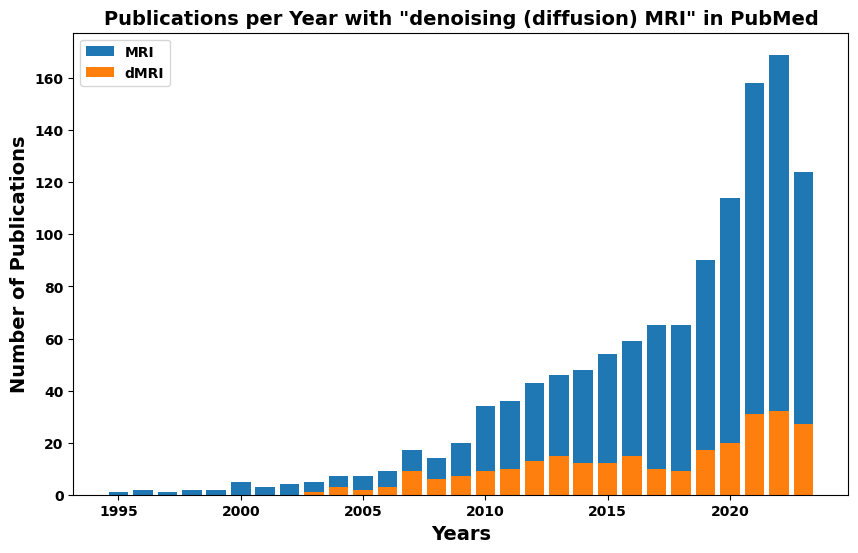

In [3]:
# Data extracted from Pubmed 
years = np.arange(1995, 2024) #until October 2023
aux = pd.read_csv(f'{dataPath}/PubMed_Timeline_Results_by_Year.csv')
MRI = aux.values[1:].flatten()[::-1].astype('int')
dMRI = pd.read_csv(f'{dataPath}/PubMed_Timeline_Results_by_Year_dMRI.csv').values[1:].flatten()[::-1].astype('int')
# Calculate the difference in lengths
length_difference = len(MRI) - len(dMRI)

# Fill the shorter array with zeros at the beginning
dMRI = np.array([0] * length_difference + list(dMRI))

# Create the stacked bar plot
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
plt.bar(years, MRI - dMRI, bottom=dMRI, label='MRI')
plt.bar(years, dMRI, label='dMRI')

# Add labels and title
plt.xlabel('Years', fontweight='bold', fontsize=14)
plt.ylabel('Number of Publications', fontweight='bold', fontsize=14)
plt.title('Publications per Year with "denoising (diffusion) MRI" in PubMed', fontweight='bold', fontsize=14)
plt.legend()

# Show the plot
plt.show()
if export_figures:
    plt.savefig(f'{figsPath}/Supp_1_publications.png', dpi=600, bbox_inches='tight')

# <a id='toc1_'></a>[**Consideration 1 - Denoising should improve raw signal quality by removing noise-related variance**](#toc1_)    

These initial figures provide qualitative and quantitative evaluations of the signal improvement (mainly) due to reduce the noise-related variance, increasing the SNR and angular-CNR of the images. For simplicity, we will work only with the first repetition of each dataset as an exemplar but conclusions can be extended to the rest of repetitions.

## <a id='toc1_1_'></a>[**Fig.1 - Qualitative maps of denoised data**](#toc1_1_)

**CAPTION**: **Figure 1. Qualitative maps of the dMRI signals before and after denoising with each method (columns)** - First row: Dataset A (2mm) in a b = 2000 s/mm2 volume. Second row: Dataset B (1.5mm) in a b = 3000 s/mm2 volume. Third row: Dataset C (0.9mm) in a b = 2000 s/mm2 volume. Arrows point to maximally attenuated signals in the ventricles where the noise-floor can be appreciated.

**RESULTS**: Qualitative demonstrations of (motion- and distortion-corrected) data before and after denoising for each method and for all the datasets are shown in Figure 1. At higher SNR (Dataset A), differences between raw and denoised data are minimal, mainly noticed for NLM, which seems to provide a smoother image. At lower SNR, a visual improvement in data quality can be perceived after denoising. Noticeably, the signal in the ventricles (which is maximally attenuated and reaches the noise-floor) is different for methods denoising in the magnitude and complex domain space (see arrows in Fig.1). This is particularly evident for the b = 2000 s/mm2 of the 0.9mm data, where methods that perform denoising in the complex domain (MPPCA*, NORDIC) seem to reduce this signal considerably more compared to the magnitude-domain approaches (NLM, |MPPCA|). Even if this elevated noise floor can be more easily appreciated in the ventricles, it seems to be present in other areas as well, when comparing magnitude vs complex approaches. The same trends are observed for the averages in the complex (AVG*) vs in the magnitude (|AVG|) domain.

**HOW TO OBTAIN**: The files are generated by the BRC_pipeline under the ```{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.nii.gz```.

*NOTE: The screenshots shown in the Fig.1 of the paper are taken from FSLEYES but here we can display a similar representation.*

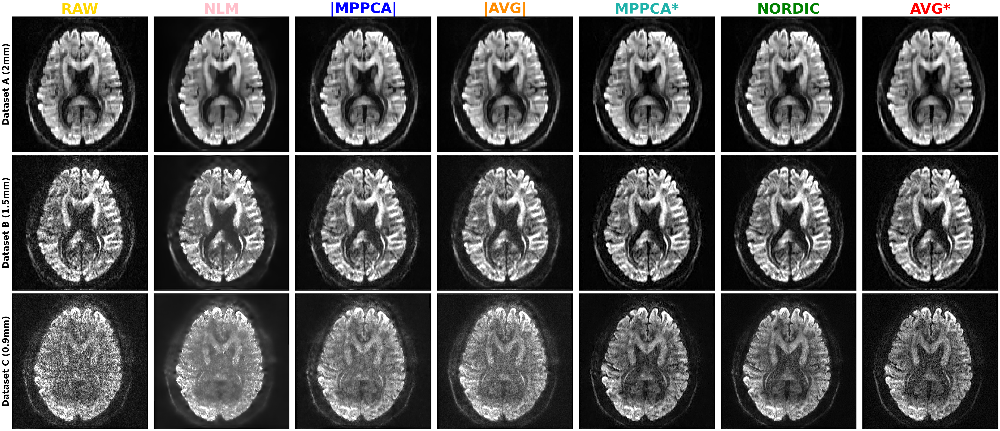

In [4]:
v_min = [0,0,0,0]            
v_max = [2300,1100,900]       # Experimental values taken from fsleyes for the highest b-shell

fig, axes = make_plotgrid(methods_names_avg, dataset_names, list_colors_avg)
for ds, dataset in enumerate(list_datasets):
    for i, ax in enumerate(axes[0]):
        img = get_data(f'{dataPath}/{dataset}/{rep}/{list_methods_avg[i]}/analysis/dMRI/processed/data/data.nii.gz')
        axes[ds,i].imshow(ndimage.rotate(img[:,:,z[ds],vols[ds]], 90), cmap='gray', vmin=v_min[ds], vmax=v_max[ds])

plt.tight_layout()
if export_figures:
    plt.savefig(f'{figsPath}/1A_{dataset}_screenshots.png', dpi=600, bbox_inches='tight')

## <a id='toc1_2_'></a>[Fig.2 & Suppl.Fig.2 - Gains in SNR and angular-CNR (whole brain & WM masks)](#toc1_2_)

**CAPTION**: - **Figure 2. Voxel-wise Signal-to-Noise Ratio (SNR) and Angular Contrast-to-Noise Ratio (CNR) in raw and denoised data** -  Boxplots correspond to the distribution of these metrics in the whole brain. Top row: Dataset A (2mm), Middle row: Dataset B (1.5mm), Bottom row: Dataset C (0.9mm). Asterisks indicate statistical significance of pairwise Wilcoxon rank-sum tests between SNR/CNR values for raw data vs each denoised approach (Bonferroni corrected for multiple comparisons).*

**METHODS**: We used a number of complementary metrics to assess gains in raw signal quality before and after denoising. First, the signal-to-noise ratio (SNR) and angular contrast-to-noise ratio (CNR) were used to evaluate how the average signal/contrast changes against noise variance. The SNR was evaluated using the average and variance of signal across multiple b = 0 s/mm2 volumes. For each b value, the angular contrast-to-noise ratio (CNR) was computed using eddyqc (Bastiani et al., 2019) that informs of angular contrast across the different diffusion sensitising directions acquired at a given b value. Angular CNR was defined as the ratio of the variance of diffusion-weighted signal across all directions at a given b value to the variance of the noise. We used the variance of the residuals of the data against a non-parametric Gaussian Process predictor in undistorted space, as implemented in eddyqc (Bastiani et al., 2019) to get an estimate of noise variance across a b shell. For our experiments, we computed voxel-wise SNR and CNR, and we reported their distributions across white and grey matter. 

**RESULTS**: Gains in raw signal quality are shown below, where boxplots correspond to distributions in the whole brain (white matter distributions are shown in Suppl. Figure 2). Firstly, the results for the raw (i.e. non-denoised) data confirm our anticipation that Dataset A, which is the lowest resolution, had the highest SNR (around 30 for b=0), followed by Dataset B (SNR=15 for b=0 on average) and then the ultra-high resolution Dataset C (SNR=5 for b=0). As expected, all denoising approaches improved SNR and angular CNR for all datasets. NLM showed the largest improvement for b=0 s/mm2 volumes; however, this behaviour was not mirrored in denoising DWI volumes. The PCA-based approaches provided the most consistent pattern of improvement across datasets and b-shells, with NORDIC providing the largest gains in CNR, especially at higher b-shells and higher resolutions.

**HOW TO OBTAIN**: The files are generated by the BRC_pipeline (eddyqc) under the ```{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/preproc/eddy/eddy_unwarped_images.eddy_cnr_maps.nii.gz```.

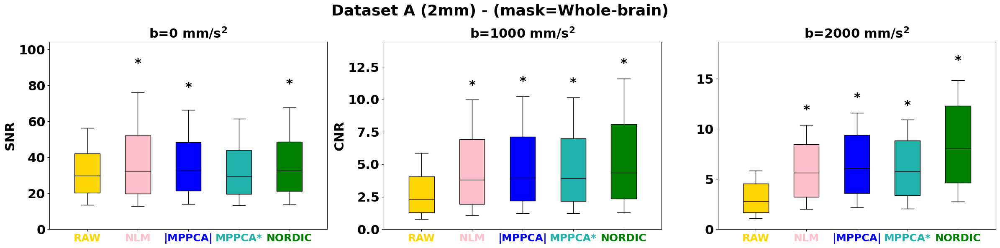

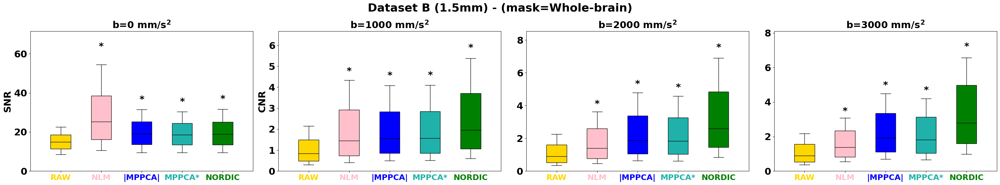

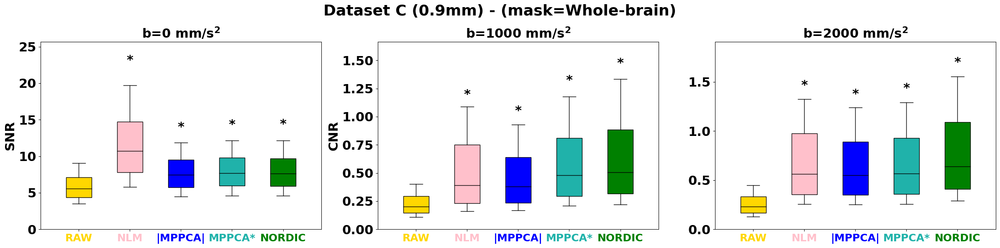

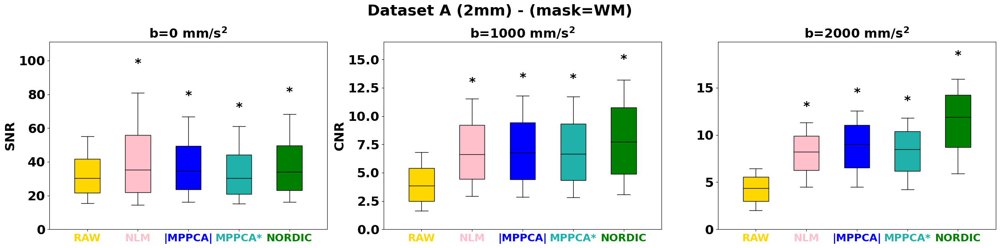

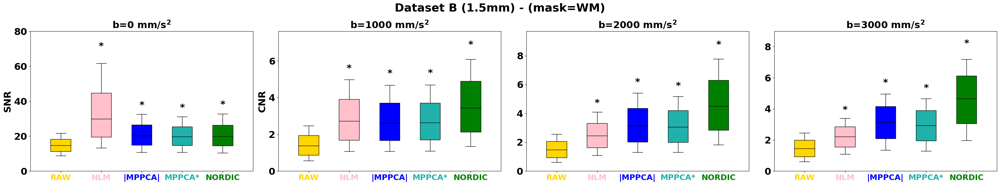

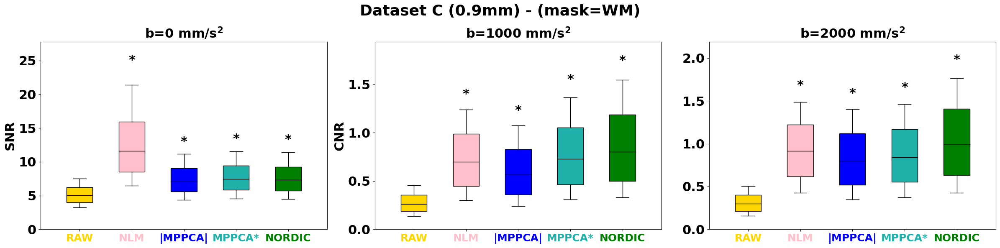

In [6]:
for masktype in ['Whole-brain', 'WM']:
    for ds, dataset in enumerate(list_datasets):
        nrows = 1 
        ncols = len(list_bvals[ds])
        fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8*ncols, 6*nrows), sharex=True, sharey=False)

        thr = 0.05/((len(list_methods)-1) * len(list_bvals[ds]))    # Bonferroni-corrected threshold for multiple comparisons
        if masktype=='Whole-brain':
            mask = get_data(f'{dataPath}/{dataset}/aux/nodif_brain_mask_ero.nii.gz', mmap=True)
        elif masktype=='WM':
            mask = get_data(f'{dataPath}/{dataset}/aux/WM_mask.nii.gz', mmap=True)
            
        list_SNR = []
        list_CNR1 = []
        list_CNR2 = []
        list_CNR3 = []
        list_data = []
                
        for meth in list_methods:
            cnr_maps = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/preproc/eddy/eddy_unwarped_images.eddy_cnr_maps.nii.gz')
            list_SNR.append(cnr_maps[:,:,:,0][mask>0].ravel())
            list_CNR1.append(cnr_maps[:,:,:,1][mask>0].ravel())
            list_CNR2.append(cnr_maps[:,:,:,2][mask>0].ravel())
            if cnr_maps.shape[3]==4:
                list_CNR3.append(cnr_maps[:,:,:,3][mask>0].ravel())  
            else:
                list_CNR3.append(cnr_maps[:,:,:,2][mask>0].ravel())

        list_data = [list_SNR, list_CNR1, list_CNR2]
        if cnr_maps.shape[3]==4:
            list_data.append(list_CNR3)

        for i in range(0, ncols):
            pvalues = []
            bpx = ax[i].boxplot(list_data[i], boxprops=dict(facecolor=list_colors[i]), **boxparams)
                
            for patch, color in zip(bpx['boxes'], list_colors):
                patch.set_facecolor(color)
            ax[i].set_title(f'b={list_bvals[1][i]} mm/s$^2$', fontweight='bold', fontsize=22)

            for b in range(len(list_methods)-1):
                _, pvalue = ranksums(list_data[i][0], list_data[i][b+1])
                pvalues.append(pvalue)
                if pvalue < thr:
                    ax[i].annotate('*', xy=(b+2, np.mean(list_data[i][b+1])+1.75*np.std(list_data[i][b+1])), color='black', fontsize=22, ha='center')
            
        # set style for the axes
        labels = methods_names
        for i, axs in enumerate(ax):
            set_axis_style(axs, labels)
            y_ticks = axs.get_yticklabels()
            axs.tick_params(axis='y', labelsize=22)
            for c, label in enumerate(axs.get_xticklabels()):
                label.set_color(list_colors[c])
                label.set_size(18)
                
        ax[0].set_ylim([0, np.mean(list_data[0][1])+2.25*np.std(list_data[0][1])])
        ax[1].set_ylim([0, np.mean(list_data[1][4])+2.25*np.std(list_data[1][4])]) #-max(list_data[1][1])/50
        ax[2].set_ylim([0, np.mean(list_data[2][4])+2.25*np.std(list_data[2][4])]) #-max(list_data[2][1])/25
        if cnr_maps.shape[3]==4:
            ax[3].set_ylim([0,np.mean(list_data[3][4])+2.25*np.std(list_data[3][4])])#-max(list_data[3][1])/25

        ax[0].set_ylabel('SNR', fontweight='bold', fontsize=22)
        ax[1].set_ylabel('CNR', fontweight='bold', fontsize=22)
        plt.suptitle(f'{dataset_names[ds]} - (mask={masktype})', fontweight='bold', fontsize=26)
        #plt.legend(list_methods)

        fig.tight_layout()
        plt.show()
        if export_figures:
            if masktype=='Whole-brain':
                plt.savefig(f'{figsPath}/2_{dataset}_SNR_CNR_boxplots_{masktype}.png', dpi=fig.dpi, bbox_inches='tight')
            elif masktype=='WM':
                plt.savefig(f'{figsPath}/Sup_2_{dataset}_SNR_CNR_boxplots_{masktype}.png', dpi=fig.dpi, bbox_inches='tight')

## <a id='toc1_4_'></a>[Fig.3 & Suppl.Fig.3 - Spherical Harmonics Power Spectra (WM & GM)](#toc1_4_)

**CAPTION**: **Figure 3 - Power spectra of Spherical Harmonics**. Mean relative change (%) in the white matter spherical harmonics (SH) power after denoising, with respect to the corresponding power for the raw data. Results for even harmonic orders L = 0 to L = 8 are presented. Top row: Dataset B (1.5mm), Bottom row: Dataset C (0.9mm).

*Note that results in gray matter (for Suppl.Fig.3) are also shown below*.

**METHODS**:
As complementary to SNR and CNR, we also looked into the power of spherical harmonics before and after denoising, as higher-order components are expected to be more contaminated by noise. We computed the signal attenuation for each dataset, by normalising using the mean b = 0 s/mm2 volume after distortion correction. We then fit real even spherical harmonics (SH) (Descoteaux et al., 2007) up to L = 8 order to the signal attenuation for each shell. We computed the power for each order as $P_i = \sum^l_{m=-l} c^2_{lm}$, for $l=0,2,4,6,8$. Denoising is expected to have a higher influence in reducing the power of higher orders (due to noise removal), compared to lower frequencies.

**RESULTS**:
We subsequently looked into the spherical harmonic spectrum of the signal and explored how different denoising methods perform across different angular frequencies. Figure 3 demonstrates changes in the power of spherical harmonic coefficients in the denoised data compared to the raw data. For each harmonic order and each shell, the % change of power of the denoised data in white matter compared to the respective power obtained for raw data is plotted (similarly for grey matter is presented in Suppl. Figure 3). Compared to raw data, all methods removed a high proportion of the power at higher harmonic orders (L ≥ 4). At low orders and low SNRs, we can see a different pattern between magnitude-based and complex-based denoising. At L = 0, complex denoising reduces more power than magnitude-base denoising (e.g. see Dataset C in Figure 3), while at L = 2 they show an increase in power (which is more noticeable as the SNR reduces). This behaviour is also observed when comparing the magnitude- and complex-averages, respectively. This reduction of L = 0 power (flat signal) and increase in L = 2 power (unimodal anisotropic signal) with complex-domain approaches can be associated with the signal recovered by pushing lower the noise-floor (see Figure 4). Indeed, noise floor can rectify the signal in very anisotropic regions and this signal can be recovered by denoising in the complex domain (see also next section). It is important to highlight here how crucial the choice of a gold standard can be in interpreting such results and how different the interpretation can be when using a biased average (magnitude domain).

**HOW TO OBTAIN**:
Run the script ```python ~/code/get_SH_power.py``` to compute the power spectra for each shell.  You can modify the script ```~/code/get_SH_power.py``` to define the input data, order L, etc. Input data: the pre-processed (distortion and motion corrected) data provided as output by the BRC_pipeline (```dMRI_preproc.sh```) under ```{dataPath}/{rep}/{meth}/analysis/dMRI/processed/data/data.nii.gz```. Outputs: This script will export the SH coefficients (```SH_signal.nii.gz```) and their power spectra (```power_SH.nii.gz```) under {dataPath}/{rep}/{meth}/analysis/dMRI/processed/data/data.SH/.

As it can take few hours to calculate all of them (especially for Dataset C), we loaded here the pre-calculated power matrices stored in ```{dataPath}/{rep}/{meth}/analysis/dMRI/processed/data/data.SH/power_SH.npy```

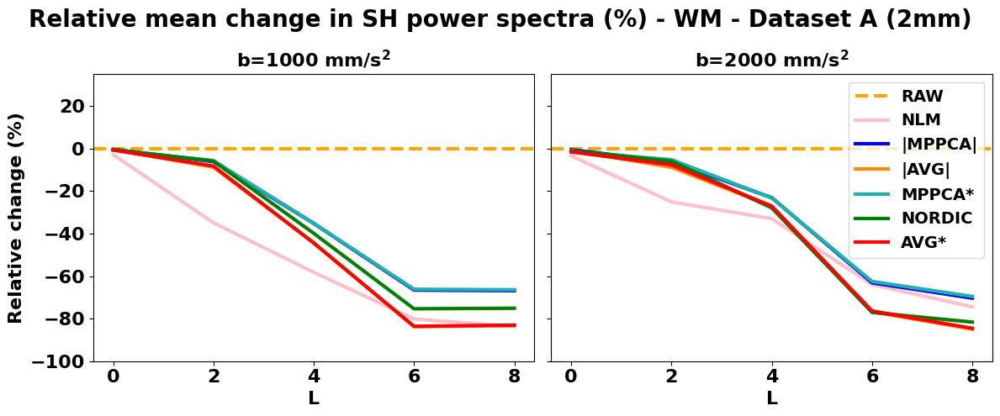

<Figure size 640x480 with 0 Axes>

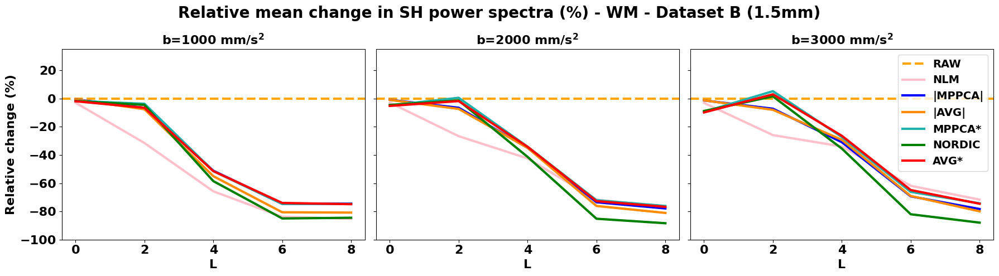

<Figure size 640x480 with 0 Axes>

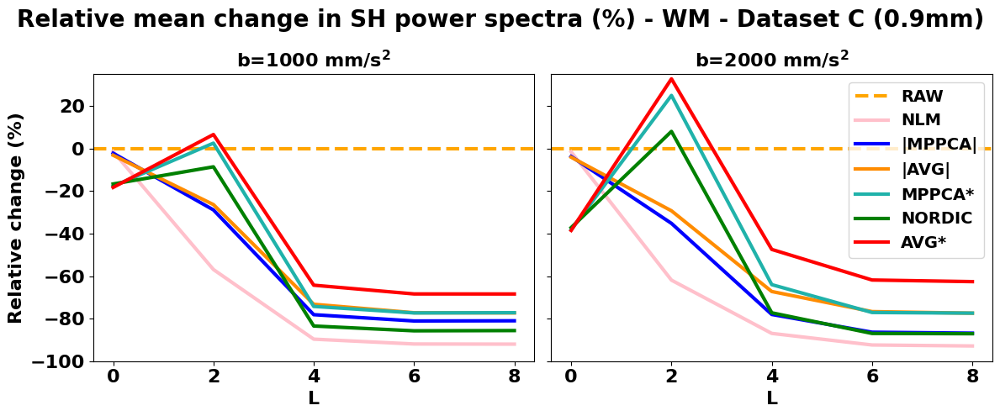

<Figure size 640x480 with 0 Axes>

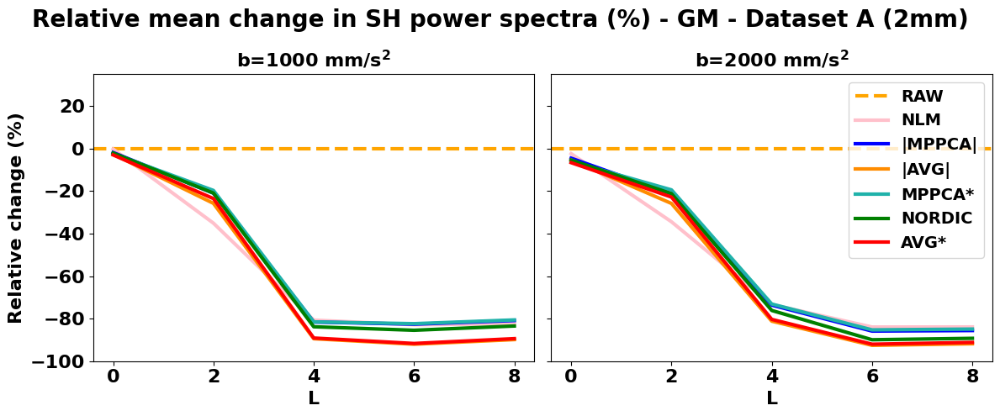

<Figure size 640x480 with 0 Axes>

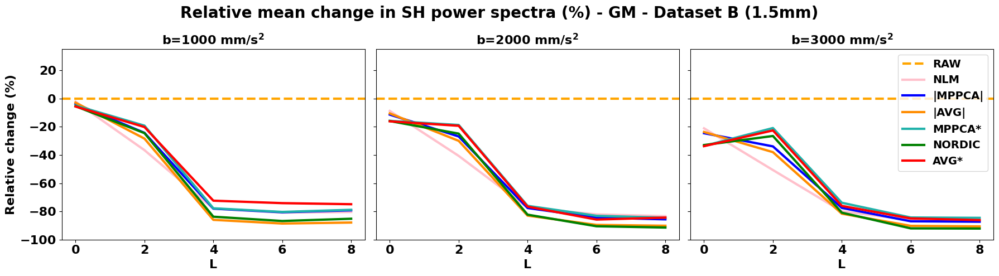

<Figure size 640x480 with 0 Axes>

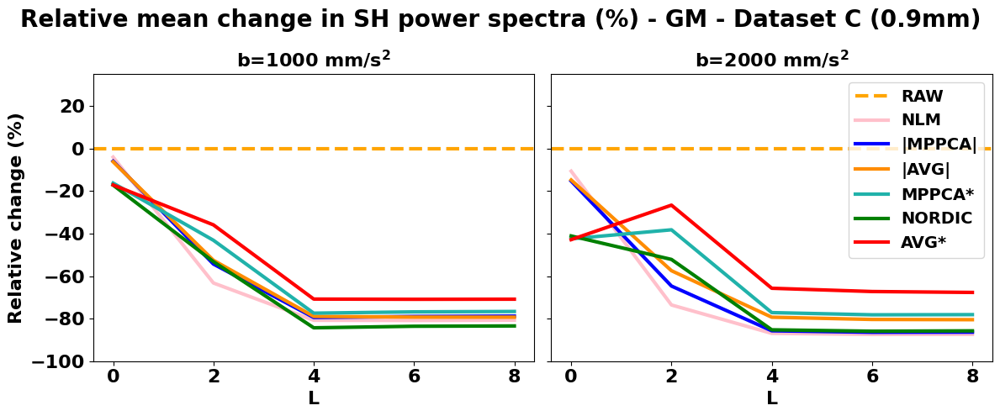

<Figure size 640x480 with 0 Axes>

In [7]:
sh_order = 8
list_orders = np.arange(0,sh_order+2,2).tolist()
export_figures = True

for masktype in ['WM', 'GM']:
    for ds, dataset in enumerate(list_datasets):
        # Load the data for each method
        data = []
        mask = get_data(f'{dataPath}/{dataset}/aux/{masktype}_mask.nii.gz', mmap=True)

        for m, meth in enumerate(list_methods_avg):
            data.append(get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.SH/power_SH.nii.gz')) # array with [x,y,z,b-shells,l_orders]

        # Create the subplots
        labels = methods_names_avg
        ncols = data[0].shape[3] #bshells
        nrows = 1
        fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 5*nrows), sharex=True, sharey=True)

        # Loop over the subplots and plot the boxplots
        mean_ = np.zeros((len(list_methods_avg)-1, data[0].shape[3], data[0].shape[4])) # methods x bvals x n_orders
        for b_idx in range(data[0].shape[3]):
            for l_idx in range( data[0].shape[4]):
                ref = np.nan_to_num(data[0][:, :, :, b_idx, l_idx][mask>0].ravel())    # non-filtered data
                for i in range(1, len(list_methods_avg)):
                    denoised = np.nan_to_num(data[i][:, :, :, b_idx, l_idx][mask>0].ravel())
                    denoised = np.clip(denoised, -np.percentile(denoised,95), np.percentile(denoised,95))
                    mean_[i-1, b_idx, l_idx] = 100*(np.mean(denoised)-np.mean(ref))/np.mean(ref)

        for i, axs in enumerate(ax):
            axs.axhline(y=0, linestyle='dashed', color='orange', label='RAW', linewidth=3)
            axs.set_xticks(np.arange(0, len(list_orders)))
            axs.set_xticklabels(list_orders, fontsize=16)
            axs.set_xlabel('L', fontsize=16, fontweight='bold')
            axs.set_ylim([-100,35])
            ax[0].tick_params(axis='y', labelsize=16)
            axs.set_title(f'b={list_bvals[ds][i+1]} mm/s$^2$', fontsize=16, fontweight='bold')
        ax[0].set_ylabel('Relative change (%)', fontsize=16, fontweight='bold')

        for i in range(ncols):
            for m in range(1, len(list_methods_avg)):
                ax[i].plot(mean_[m-1,i,:], color=list_colors_avg[m], linewidth=3, label=methods_names_avg[m])
                    
        plt.suptitle(f'Relative mean change in SH power spectra (%) - {masktype} - {dataset_names[ds]}', fontweight='bold', fontsize=20)
        plt.legend(fontsize=14)
        fig.tight_layout()
        plt.show()
        if export_figures:
            if masktype == 'WM':
                plt.savefig(f'{figsPath}/3_{dataset}_SH_spectra_mean_{masktype}.png', dpi=fig.dpi, bbox_inches='tight')
            elif masktype == 'GM':
                plt.savefig(f'{figsPath}/Sup_3_{dataset}_SH_spectra_mean_{masktype}.png', dpi=fig.dpi, bbox_inches='tight')

## <a id='toc1_5_'></a>[Suppl.Fig.4 - Spatial maps of differences in Spherical Harmonics Power Spectra in magnitude- and complex-denoising](#toc1_5_)   

**CAPTION**: **Suppl. Figure 4. Exemplar maps of the differences in the SH power spectra in magnitude- and complex-denoising** at orders L=0 and L=2 (Dataset C, b=2000 s/mm2). Reduction of L=0 power (flat signal) and increase in L=2 power (unimodal anisotropic signal) with complex-domain approaches can be associated with the signal recovered by pushing lower the noise-floor.

**RESULTS**: At L = 0, complex denoising reduces more power than magnitude-base denoising (e.g. see Dataset C in Figure 3), while at L = 2 they show an increase in power (which is more noticeable as the SNR reduces). This behaviour is also observed when comparing the magnitude- and complex-averages, respectively. This reduction of L = 0 power (flat signal) and increase in L = 2 power (unimodal anisotropic signal) with complex-domain approaches can be associated with the signal recovered by pushing lower the noise-floor. 

**HOW TO OBTAIN**: It uses the same files than in Fig.3 and Suppl.Fig.3.


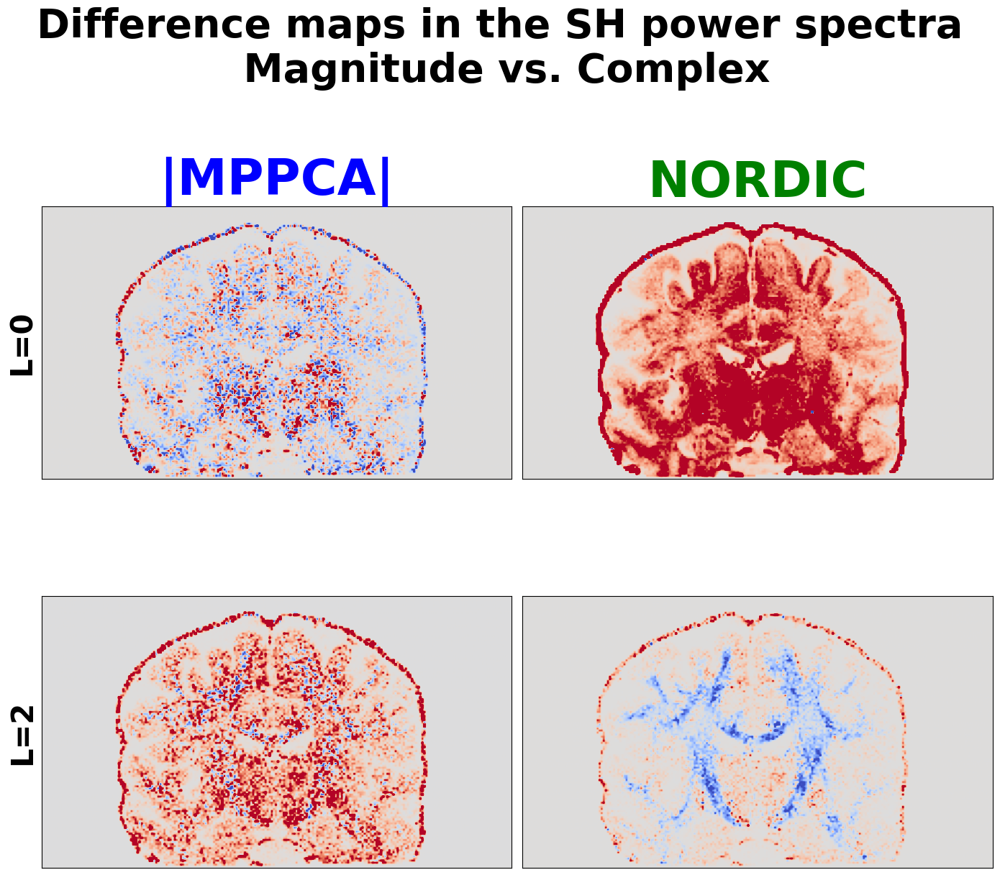

In [85]:
ds=2
dataset='Dataset_C'
mask = get_data(f'{dataPath}/{dataset}/aux/nodif_brain_mask_ero.nii.gz')        
raw = get_data(f'{dataPath}/{dataset}/{rep}/RAW/analysis/dMRI/processed/data/data.SH/power_SH.nii.gz') # array with [x,y,z,b-shells,l_orders]
mppca = get_data(f'{dataPath}/{dataset}/{rep}/MPPCA/analysis/dMRI/processed/data/data.SH/power_SH.nii.gz')
nordic = get_data(f'{dataPath}/{dataset}/{rep}/NORDIC/analysis/dMRI/processed/data/data.SH/power_SH.nii.gz')
mppca_diff = (raw-mppca)
nordic_diff = (raw-nordic)
fig, ax = make_plotgrid(['|MPPCA|', 'NORDIC'], ['L=0', 'L=2'], ['blue', 'green'], suptitle='Difference maps in the SH power spectra\n Magnitude vs. Complex')
ax[0,0].imshow(ndimage.rotate(mppca_diff[:,y[ds],:,1,0], 90), cmap='coolwarm', vmin=-0.5, vmax=0.5)
ax[0,1].imshow(ndimage.rotate(nordic_diff[:,y[ds],:,1,0], 90), cmap='coolwarm', vmin=-1, vmax=1)
ax[1,0].imshow(ndimage.rotate(mppca_diff[:,y[ds],:,1,1], 90), cmap='coolwarm', vmin=-0.05, vmax=0.05)
ax[1,1].imshow(ndimage.rotate(nordic_diff[:,y[ds],:,1,1], 90), cmap='coolwarm', vmin=-0.15, vmax=0.15)
plt.tight_layout()

## <a id='toc1_6_'></a>[Suppl.Fig.5 - Spatial maps of Spherical Harmonics Power Spectra](#toc1_6_)

**CAPTION**: **Suppl. Figure 5. Exemplar maps of the white matter power spectra** of even harmonics orders L=0−4 Spherical Harmonics for Dataset C (0.9mm) in the highest b-shell (b=2000 s/mm2). For each row the same minimum and maximum intensity limits have been used for visualisation, so brightness of intensity corresponds to absolute power for each case (i.e., denoised data reduces power at higher orders L).

**RESULTS**: The spatial pattern of the power spectra for different frequencies can be observed in the exemplar brain maps of Suppl. Figure 5 for Dataset C. It can be seen 1) a spatially-homogeneous power reduction at L = 0 by complex denoising (and a strong spatial smoothing effect in NLM); 2) an increment of power at L = 2 by complex denoising in the white matter; and 3) a considerable reduction of power in the whole brain at L = 4 by all denoising methods compared to raw data (a relatively uniform L = 4 map prior to denoising, becomes concentrated mostly in white matter areas after denoising). 

**HOW TO OBTAIN**: It uses the same files than in Fig.3 and Suppl.Fig.3.

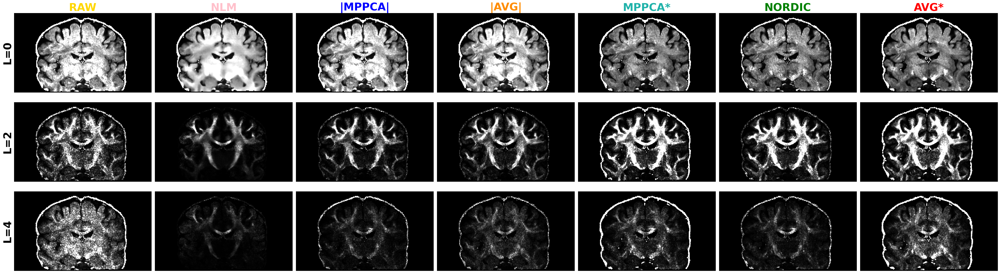

In [86]:
# Empirical values for WM
v_max = [[1.75, 0.25, 0.025, 0.009, 0.03],
        [2, 0.3, 0.05, 0.004, 0.01], 
        [3, 0.15, 0.1, 0.025, 0.025]]  

ds=2
dataset='Dataset_C'

# Load the data for each method
data = []
mask = get_data(f'{dataPath}/{dataset}/aux/nodif_brain_mask_ero.nii.gz')
        
for m, meth in enumerate(list_methods_avg):
    data.append(get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.SH/power_SH.nii.gz')) # array with [x,y,z,b-shells,l_orders]
                
b_idx = -1 #highest bval
nrows = 3 # Just the first 3 L-orders -- data[0].shape[4]
ncols = len(list_methods_avg)   
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 5*nrows), sharex=True, sharey=False)
plt.subplots_adjust(wspace=-0.05, hspace=-0.60)

for l_idx in range(nrows):
    for m, meth in enumerate(list_methods_avg):
        img_NaNcorr = np.nan_to_num(data[m][:, y[ds], :, b_idx, l_idx])
        img_NaNcorr_masked = np.ma.masked_where(mask[:,y[ds],:] == 1, img_NaNcorr)
        im = ax[l_idx,m].imshow(ndimage.rotate(img_NaNcorr_masked, 90), vmax=v_max[ds][l_idx], vmin=0, cmap='gray', aspect='equal') 

for i in range(ncols):
    ax[0,i].set_title(f'{methods_names_avg[i]}', fontweight='bold', fontsize=32, color=list_colors_avg[i])  # Title

for i in range(nrows):
    ax[i,0].set_ylabel(f'L={2*i}', fontweight='bold', fontsize=32)    # ylabel     

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
fig.tight_layout()
if export_figures:
    plt.savefig(f'{figsPath}/Sup_5_{dataset}_SH_spectra.png', dpi=fig.dpi, bbox_inches='tight')

# <a id='toc2_'></a>[**Consideration 2 - Denoising should preserve the expected statistical distribution properties of the dMRI signal and remove biases introduced by the noise-floor**](#toc2_)

Whereas noise in the complex domain is zero-mean Gaussian, dMRI signal produced by modern protocols is noncentral-Chi distributed in the general case (Aja-Fernández et al., 2011; Aja-Fernández and Vegas-Sánchez-Ferrero, 2016). This can lead to an elevated noise floor in the magnitude domain (the minimum measurable signal given the noise level) compared to classical MRI experiments where magnitude signal follows a Rician distribution (Gudbjartsson and Patz, 1995; Salvador et al., 2005). As dMRI information is encoded in the signal attenuation, intensities can be as low as the noise floor in a) regions where the signal attenuation is sufficiently high (e.g. CSF-filled areas or anisotropic regions such as in the Corpus Callosum), and/or b) when b-value and/or spatial resolution are pushed to high limits. In such cases, the signal can be non-linearly rectified leading to biases in a number of extracted features (Jones and Basser, 2004; Sotiropoulos et al., 2013c). The noise-floor can be particularly pronounced in noisy acquisitions, where denoising is expected to be most beneficial. Furthermore, elevated noise floors could be indicative of data that are further away from the Rician distribution regime - typically expected for magnitude MRI data- and are closer to a non-central chi distribution; this can affect any subsequent processing that assumes Gaussian or Rician noise (as a Rician distribution can be typically reduced to a Gaussian for SNR>3 (Salvador et al., 2005). For all these reasons, it is essential that a denoising approach accounts for and, ideally, mitigates these effects. 

## <a id='toc2_1_'></a>[**Fig.4 - Difference maps**](#toc2_1_)

**CAPTION**: **Figure 4 - Difference between raw magnitude and denoised data** - The difference $\Delta$, where $\Delta=S_{RAW} - S_{denoised}$ for each voxel, is represented for each method in an exemplar axial slice, and its corresponding histogram of values withing the brain is shown. In the histogram, the vertical black dashed line indicates $\Delta=0$, while the coloured dashed line indicates the mode of the actual distribution of the differences. For each dataset, all plots are displayed in the same range of calues (as a function of the standard deviation $\sigma$ of the distribution, indicated by the colourbar).

**RESULTS**: We first explored the type of information that is removed during denoising. Figure 4 shows difference maps estimated between the raw magnitude data and the denoised images within the brain, and their corresponding histograms. Ideally, these differences should arise only from thermal noise, which is spatially randomly distributed in nature, leading to a zero-mean Gaussian distribution of the intensity values. This is the behaviour that, a priori, can be observed for magnitude MPPCA and that has been extensively reported in previous studies as a sign of good denoising (e.g., (Veraart et al., 2016b)). However, zero-mean Gaussian noise properties only hold in the complex domain. In the magnitude domain, a Rician/non-Chi-squared signal distribution is instead expected, which induces a noise floor. Hence, denoising that induces a zero-mean difference map with respect to the magnitude raw data is indicative of retaining the noise floor. We can observe that denoising in the complex domain leads to a non-zero (positive) mean-centred distribution of differences (see histograms of Figure 4)), meaning that denoised signal intensities are on average lower than in raw data. This is commensurate with the hypothesis that the signal rectification caused by the noise floor is reversed and the associated signal elevation is removed.

**HOW TO OBTAIN**: Calculate the differences (e.g. with fslmaths -sub) in the non-preprocessed data (i.e. RAW and data right after denoising) to produce the ```{dataPath}/{dataset}/rep1/{meth}/raw/difference.nii.gz```. This script will use that file.

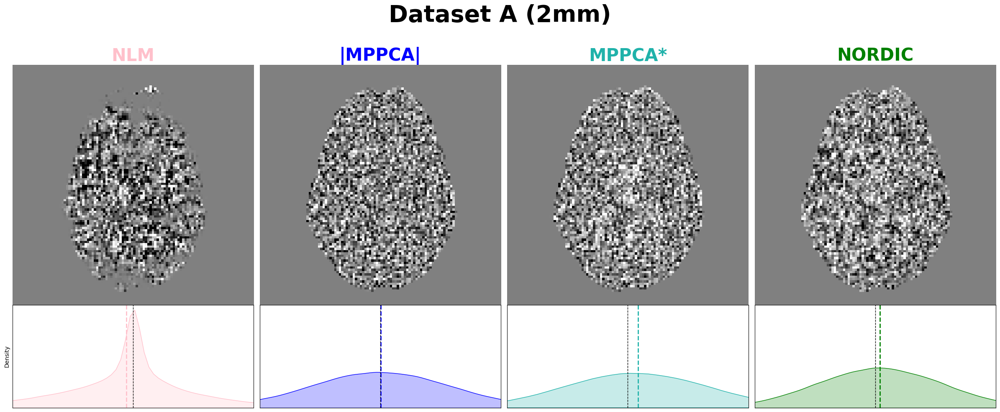

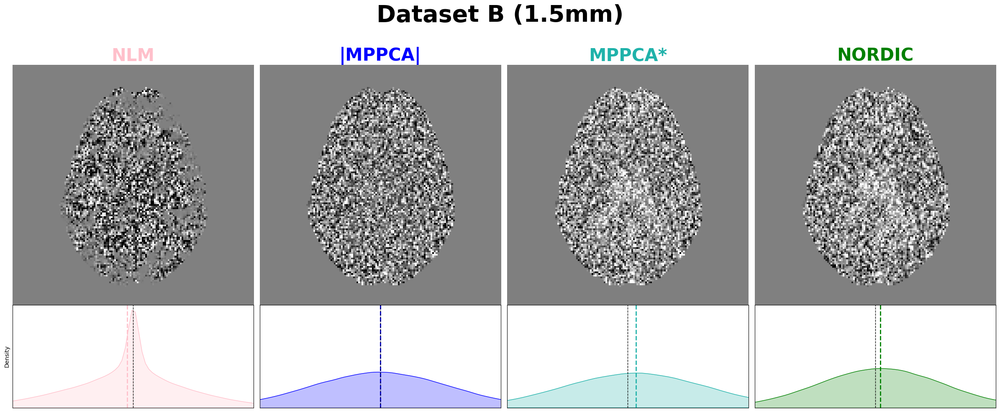

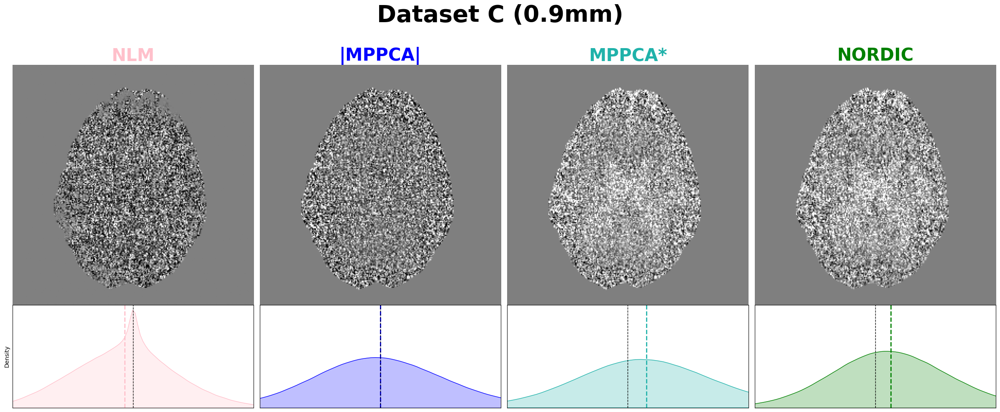

In [16]:
# Plot difference maps in a single exemplar volume
export_figures = True

for ds, dataset in enumerate(list_datasets):
    nrows = 2
    ncols = len(methods_names[1:])
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6*ncols, 5*nrows), sharex='row', sharey='row', gridspec_kw={'height_ratios': [3, 1]})

    mask = get_data(f'{dataPath}/{dataset}/aux/nodif_brain_mask_ero.nii.gz', mmap=True)

    for i in range(0,ncols):    
        img = get_data(f'{dataPath}/{dataset}/rep1/{list_methods[i+1]}/raw/differences.nii.gz')
        img_volume = img[:,:,:,vols[0]]
        masked_volume = img_volume[mask>0].ravel()          #535k voxels at 1.5mm
        img_slice = img[:,:,z[ds],vols[ds]]
        
        # Exemplar slice map masked to brain
        masked_slice = img_slice*mask[:,:,z[ds]]
        v_max = 3*np.std(masked_slice)
        ax_imshow = ax[0,i]
        ax_imshow.imshow(ndimage.rotate(masked_slice, 90), cmap='gray', vmin=-v_max, vmax=v_max)
        ax_imshow.axis('off')
        ax_imshow.set_title(methods_names[i+1], fontweight='bold', size=fig.dpi*0.3, color=list_colors[i+1])    # Size of titles in function of the figsize
        plt.setp(ax_imshow, xticks=[], yticks=[])

        # Add colorbar to the last imshow
        #if i == ncols-1:
        #    divider = make_axes_locatable(ax_imshow)
        #    cax = divider.append_axes('right', size='5%', pad=0.05)
        #    cbar = fig.colorbar(im, cax=cax, orientation='vertical', location = 'right', aspect=25)
        #    cbar.ax.set_ylabel('d', fontsize=20)

        # Distribution of difference values in that volume
        if ((list_methods[i+1]=='MPPCA_real') and (dataset=='Dataset_C')):
            sns.kdeplot(masked_volume,color=list_colors[i+1], ax=ax[1,i], fill=True)#, bins=500) #distplot
        else:
            sns.kdeplot(masked_volume,color=list_colors[i+1], ax=ax[1,i], fill=True)#, bins=200)
            
        ax[1,i].axvline(x=np.mean(masked_volume),color=list_colors[i+1], ls='--', lw=2)
        ax[1,i].axvline(x=0,color='black', ls='--', lw=1)
        ax[1,i].set_xlim([-v_max, v_max])
        plt.setp(ax[1,i], xticks=[], yticks=[])

    fig.suptitle(dataset_names[ds], fontweight='bold', size=fig.dpi*0.4)
    plt.subplots_adjust(wspace=0.0, hspace=-0.25)
    fig.tight_layout()
    plt.show()
    
    if export_figures:
        fig.savefig(f'{figsPath}/4_{dataset}_difference_maps_volume.png', dpi=600, bbox_inches='tight')

## <a id='toc2_2_'></a>[**Fig.5A - Noise distributions**](#toc2_2_)

**CAPTION**: **Figure 5. Noise-floor effects and signal rectification (Dataset C)** - A) Histogram of the signal intensity values in the ventricles obtained from the different denoised datasets. 

**METHODS**: Many pre-processing and modeling stages assume specific statistical noise properties, e.g. data corrupted by additive gaussian noise. Violation of these assumptions may introduce inaccuracies and biases in the model estimates. Although thermal noise is AWGN by definition, different reconstruction and pre-processing steps, as denoising, may modify its statistical properties. One of the most impactful deviations is the elevation of the noise-floor, which can produce rectification of the signal in high attenuation regions.In order to explore the behaviour of different denoising approaches, we first looked into the distribution of noise intensities before and after denoising. In the case of spatially stationary noise, obtaining such noise distribution from the background voxels of the image would suffice. With multi-channel coils however, noise properties vary spatially (Dietrich et al., 2008). Therefore, we extracted the distribution of noisy signals from the centre of the brain by considering voxels inside the ventricles, where the signal is maximally attenuated and is expected to represent mostly noise. 

**RESULTS**: The signal intensity distribution from voxels in the ventricles across all volumes is shown below for each method in Dataset C (0.9mm). The signal is maximally attenuated in these CSF-filled regions, so what is effectively depicted is a proxy to the distribution of noise, before and after denoising. The histograms of all denoised datasets show an evident reduction of the signal variance (more restricted range of values), as expected and in agreement with the SNR/CNR trends shown before. The mode of this distribution is roughly equivalent to the raw magnitude data for all denoising methods that operate in the magnitude domain. However, the mean of the noise distribution is reduced for MPPCA*, NORDIC, and AVG*, consistent with that denoising in the complex domain reduces the noise floor.

**HOW TO OBTAIN**: Use the ```{dataPath}/{ds}/aux/ventricles_mask.nii.gz``` to extract the *timeseries* (intensity accross volumes) in the ventricles voxels in the already pre-processed. Use this to plot the distributions


In [10]:
# Ensures there exists the extracted "timeseries" for all the data
for ds, dataset in enumerate(list_datasets):
    for i, meth in enumerate(list_methods_avg):
            if os.path.isfile(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/ts_CSF.txt'):
                pass
            else:
                cmd_background = f'fslmeants -i {dataPath}/{ds}/{rep}/{meth}/analysis/dMRI/processed/data/data.nii.gz' \
                f' -o {dataPath}/{ds}/{rep}/{meth}/analysis/dMRI/processed/data/ts_CSF.txt' \
                f' -m {dataPath}/{ds}/aux/ventricles_mask.nii.gz --showall'
                subprocess.check_call(cmd_background, shell=True, executable='/bin/bash')

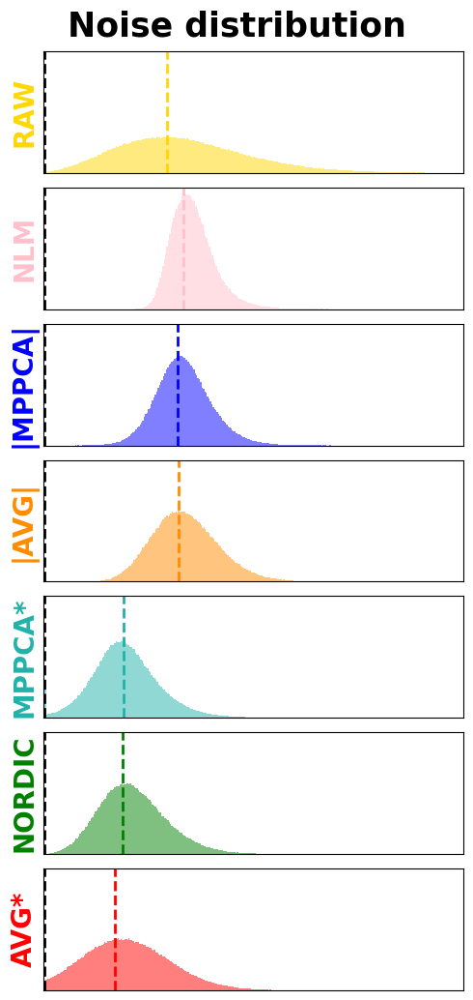

In [11]:
ds=2
dataset='Dataset_C'
nrows = len(methods_names_avg)
ncols = 1
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5,1.5*nrows), sharex='col', sharey='col')          

for i in range(0, nrows):    
    ts_csf = np.loadtxt(f'{dataPath}/{dataset}/rep1/{list_methods_avg[i]}/analysis/dMRI/processed/data/ts_CSF.txt')[3:].ravel() #First 3 columns of the fslmeants output are not of interest
    weights_csf = np.ones_like(ts_csf) / float(len(ts_csf))
    # Histogram
    ax[i].hist(ts_csf, color=custom_palette_avg[i], bins=1500, density=True, alpha=0.5)
    # Find the maximum of the histogram
    hist, bin_edges = np.histogram(ts_csf[ts_csf>10], bins=1500)
    max_bin = np.argmax(hist)
    x_peak = (bin_edges[max_bin] + bin_edges[max_bin+1])/2

    # And plot that and the x=0 as a reference
    ax[i].axvline(x=x_peak, color=list_colors_avg[i], ls='--', lw=2)
    ax[i].axvline(x=0, color='black', ls='--', lw=2)
    
#ax[i].set_xlim([np.min(ts_csf)-x_peak/2, 6*x_peak])
ax[i].set_xlim([-5, 6*x_peak])

for i, title in enumerate(methods_names_avg):
    ax[i].set_ylabel(title, fontweight='bold', size=fig.dpi*0.2, color=list_colors_avg[i])    # Size of titles in function of the figsize

for axs in fig.get_axes():
    plt.setp(axs, xticks=[], yticks=[])
fig.suptitle('Noise distribution', fontweight='bold', size=fig.dpi*0.25)
plt.subplots_adjust(wspace=0.0, hspace=-0.25)
fig.tight_layout()
plt.show()

if export_figures:
    fig.savefig(f'{figsPath}/5_{dataset}_noise_dist.png', dpi=600, bbox_inches='tight')


## <a id='toc2_3_'></a>[**Fig.5.B - Signal rectification**](#toc2_3_)

**CAPTION**: **Figure 5 & Suppl.Fig.6. Noise-floor effects and signal rectification (Dataset C)** - B) Signal intensity values in an example high FA voxel (FA>0.8) from the Corpus Callosum. Signal for different diffusion-sensitising volumes has been ordered so that gradient orientations are from parallel to perpendicular to the primary fibre orientation (DTI v1) of AVG*, i.e. approximately lowest to highest signal intensity. To aid visualisation, dashed lines in panel B represent the median value of the first points of representative denoised signals (complex and magnitude MPPCA). These reflect the lowest signal (i.e. parallel to the main fibre orientation) for that WM voxel in each case. An indication of the corresponding dynamic range is also shown as the difference between these lowest signals against the maximum signal in each case (median of last 15 points for each case, reflecting signal roughly perpendicular to the main fibre orientation).

**METHOD**: To further explore noise-floor effects in the WM, voxels with very large attenuation, such as in the mid-body of the Corpus Callosum were considered. Due to the large anisotropy in these regions, the signal in these voxels has a large dynamic range (from signal acquired parallel to perpendicular to the fibres) and is also maximally attenuated compared to any other WM region when looking parallel into the main fibre orientation. To better capture and visualise noise floor effects on data acquired with diffusion gradients going from parallel to perpendicular to the main fibre direction we did as follows. We reordered the signal intensities in each voxel in descending order based on the dot product of the corresponding DTI principal eigenvector and the diffusion-sensitising orientations. 

**RESULTS**: Below we show the signal of an example anisotropic voxel in the mid-body of the Corpus Callosum in Dataset C (more examples shown in Suppl. Figure 6). The raw and different denoised dMRI signals for that voxel have been sorted based on the alignment of the corresponding diffusion-sensitising gradient direction and the primary fibre orientation in this voxel (given by the DTI primary eigenvector of AVG*). Hence, the signals from directions parallel to the primary fibre orientation are presented first, and signals perpendicular to it are presented last. Consequently, the first signals are maximally attenuated, while the last signals are minimally attenuated. Before denoising (yellow line), the maximally attenuated signals have been rectified by the noise-floor and appear roughly similar to the minimally attenuated signals (i.e., small dynamic range). This behaviour is preserved when denoising in the magnitude domain. On the other hand, denoising in the complex domain increases the dynamic range of the signal and mitigates the effects of the noise floor.

**HOW TO OBTAIN**: To order the orientations from parallel to perpendicular  (done voxel-wise by the ```~/code/rearrange_signal.py``` script) it requires having access to a principal orientation direction (V1), which can be obtained easily e.g. by dtifit. We used here the one obtained from the AVG* as gold-standard. The code below will rearrange the signals in every voxels and export the rearranged data (so next time you can skip this process). The script ```~/code/localize_highFA.py``` will localise and return the rearranged signal from the ```nvoxels``` voxels with highest FA in the ```mask``` (the Corpus Callosum in this case). If you want to reproduce the AVG datasets as well (Suppl.Fig.6), change `list_methods` by `list_methods_avg` (and the respective names and colors).

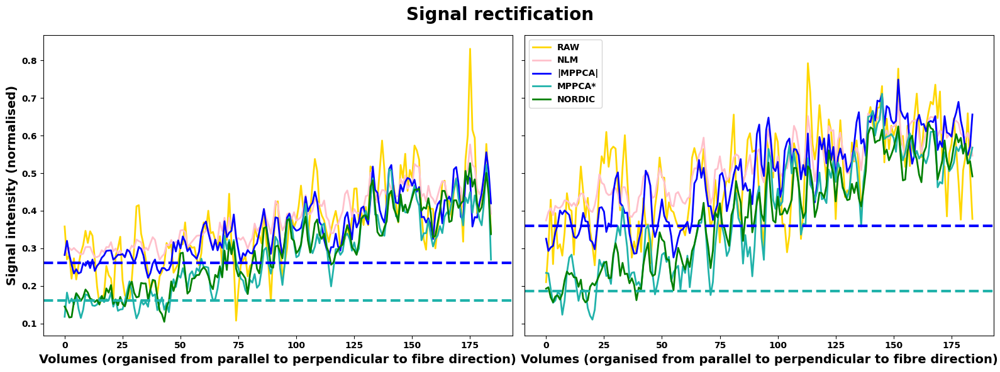

In [87]:
export_figures = True
nvoxels = 2
ds = 2
dataset = 'Dataset_C'

mask = get_data(f'{dataPath}/{dataset}/aux/CC_mask.nii.gz')

# Rearrange the data in a given mask
coords = np.array(np.where(mask != 0))
if coords.shape[0] == 2:
    coords = np.concatenate((coords, np.ones((1, coords.shape[1]))), axis=0)
elif coords.shape[0] == 1:
    coords = np.concatenate((coords, np.ones((2, coords.shape[1]))), axis=0)

bvals = np.loadtxt(f'{dataPath}/{dataset}/aux/AP.bvals')
bvecs = np.loadtxt(f'{dataPath}/{dataset}/aux/AP.bvecs')

# Re-arrange respect to the reference, the complex average in this case.
data_rearranged = []
v1 = get_data(f'{dataPath}/{dataset}/{rep}/AVG_complex/analysis/dMRI/processed/data/data.dti/dti_V1.nii.gz')
for m, meth in enumerate(list_methods):
    if os.path.isfile(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data_rearranged.npy'):
        data_aux = np.load(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data_rearranged.npy')
        data_rearranged.append(data_aux)
    else:
        data = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.nii.gz')
        data_aux = np.zeros(data.shape)
        for x,y,z in coords.T:
            data_aux[x,y,z] = rearrange_signal(data[x,y,z], v1[x,y,z], bvecs, bvals)

        data_rearranged.append(data_aux)
        np.save(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data_rearranged.npy', data_aux, allow_pickle=True)

# Localize higher FA values within the mask (high anisotropy, likely rectification)
FA_map = get_data(f'{dataPath}/{dataset}/{rep}/AVG_complex/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
idx = localize_highFA(FA_map, mask, nvoxels)
        
fig, ax = plt.subplots(1, nvoxels, figsize=(16,6), sharex=True, sharey=True)
k = 0
b0_len = len(np.argwhere(bvals<200))
maxval = 0
for x,y,z in idx.T:
    for m, meth in enumerate(list_methods):
        #ax[k].plot(data_rearranged[m][x,y,z,b0_len:]/np.max(data_rearranged[0][x,y,z,b0_len:]), color=list_colors_avg[m], linewidth=2)
        ax[k].plot(smooth(data_rearranged[m][x,y,z,b0_len:]/np.max(data_rearranged[0][x,y,z,b0_len:]),3), color=list_colors[m], linewidth=2)
        ax[k].set_xlabel('Volumes (organised from parallel to perpendicular to fibre direction)', fontsize=14, weight='bold')
    mag_nf = np.median(smooth(data_rearranged[2][x,y,z,b0_len:b0_len+20]/np.max(data_rearranged[0][x,y,z,b0_len:]),3))
    comp_nf = np.median(smooth(data_rearranged[3][x,y,z,b0_len:b0_len+20]/np.max(data_rearranged[0][x,y,z,b0_len:]),3))
    ax[k].axhline(y=mag_nf, linestyle='dashed', color=list_colors[2], linewidth=3)
    ax[k].axhline(y=comp_nf, linestyle='dashed', color=list_colors[3], linewidth=3)
    k += 1

k -= 1
ax[0].set_ylabel('Signal intensity (normalised)', fontsize=14, weight='bold')
plt.legend(methods_names, loc='upper left',fontsize=10)
plt.tick_params(axis='y', labelsize=12)
fig.suptitle(f'Signal rectification', fontsize=20, weight='bold')
plt.tight_layout()
plt.show()
    
if export_figures:
    fig.savefig(f'{figsPath}/Sup_6_{dataset}_signal_rectification.png', dpi=600, bbox_inches='tight')

# <a id='toc3_'></a>[**Consideration 3 - Denoising should increase the similarity of a dataset against a low-noise gold standard, such as the average of multiple repeats**](#toc3_)

We don't provide specific plots for this consideration but every comparison done agains the AVG* in the rest of the work leads to this point.

# <a id='toc4_'></a>[**Consideration 4 - Denoising should preserve the spatial resolution of the original data**](#toc4_)



Most denoising approaches operate using the principle of redundancy in all sampling domains, where noise at a sample (e.g., voxel) can be determined by using information from other independent samples. Therefore, it is relevant to question whether independent elements in an image change after denoising. As the approaches evaluated make use of spatial patches, we explored whether covariances are introduced after denoising and whether the size of the employed patches can have an effect. We used the idea of identifying smoothness of an image using standardised residuals from a model fit, which is based on Gaussian random field theory and has been commonly used in functional MRI for cluster-based inference (Hayasaka and Nichols, 2003) (Kiebel et al., 1999). By using the spatial covariance of the image partial derivatives computed along a given image dimension, it is possible to identify the degree of smoothness in the data (i.e., effective resolution). More specifically, to estimate resolution, we used FSL’s smoothest tool (Jenkinson et al., 2012) (Flitney & Jenkinson 2000) that estimates the smoothness of Gaussian kernels to noise images/model residuals and returns the average Full-Width Half-Maximum (FWHM) as an approximation to the actual spatial resolution. This kernel can be interpreted as the one that would produce the same smoothing as the one we observed in the input images.

We used the residuals after fitting biophysical models to the data, before and after denoising. We fitted two different models to ensure generalisability of findings: the diffusion tensor (DTI) model (Basser and Pierpaoli, 1996) to the lower b = 1000 s/mm2 shell in each case, and the diffusion kurtosis (DKI) model (Jensen et al., 2005) to the b = 1000 and b = 2000 s/mm2 shells. We then used the predicted measurements from these models to obtain the residuals and calculate the FWHM of their best Gaussian fit. We repeated this process for the different denoising approaches and at different patch-sizes to explore potential dependencies against patch-size.


## <a id='toc4_1_'></a>[Fig.6 & Suppl.Fig.7 - Estimated voxel resolution using DTI (& DKI) residuals](#toc4_1_)

**CAPTION**: **Figure 6. Estimated voxel resolution** for the denoised and non-denoised datasets, along the frequency (acquisitions along x-axis) and encode (acquisitions along y-axis) directions - Top row: Dataset B (1.5mm); Bottom row: Dataset C (0.9mm). Dashed line: acquisition nominal resolution.*

**RESULTS**: Figure 6 shows the estimated resolution in the images before and after denoising compared to the nominal resolution (dashed line). DTI model residuals have been used to estimate smoothness in the data (version with DKI model residuals is presented in the Suppl. Figure 7, showing similar trends). As noticed in the raw data, due to the point-spread-function blurring, resolution along the phase-encoding direction (y-axis) is always smaller than nominal, while in the frequency encoding direction (x-axis) it is very close to nominal, as expected. We can observe that all denoising methods incur a resolution penalty. 

**HOW TO OBTAIN**: In the already pre-processed data, run e.g. ```bash ~/code/get_Resels.sh ${dPath} Dataset_B ~/aux/nodif_brain_mask_ero.nii.gz``` to get the resels estimates from both DTI and DKI residuals (it follows the processed described above). The code below will read the ```~/smoothest_res.txt``` and plot them appropiately. If you want to represent the resels estimates from the DKI model, modify ```modelfit='dki'``` below.

/tmp/ipykernel_3927237/227218430.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_yticklabels(np.round(ax[0].get_yticks(),2), fontsize=16)


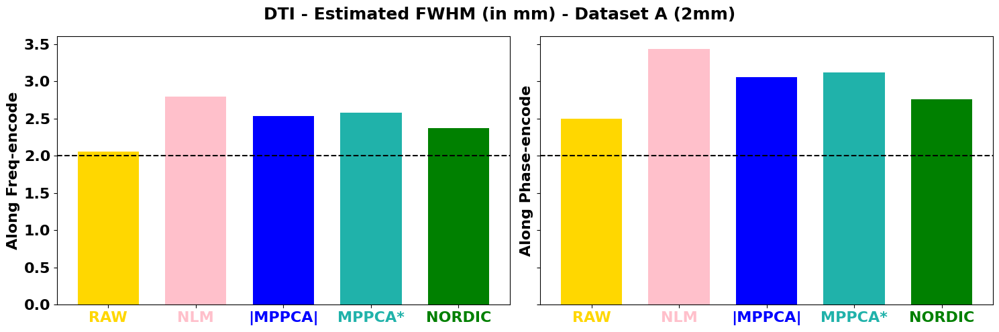

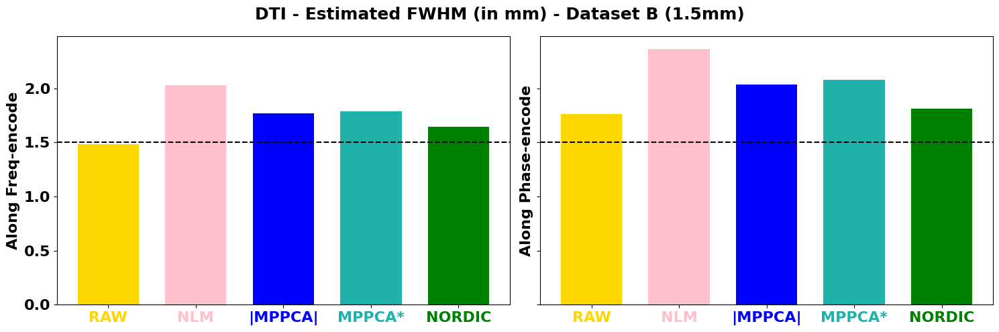

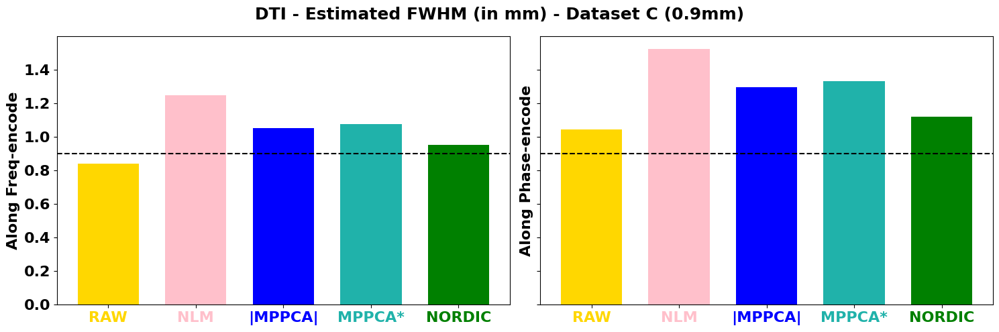

In [88]:
modelfit = 'dti' #'dki'
x = np.arange(len(list_methods))

for ds, dataset in enumerate(list_datasets):
    res_table = np.zeros((len(list_methods), 3))
    
    for m, meth in enumerate(list_methods):
        res_table[list_methods.index(meth), :], resVol = read_residuals(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.{modelfit}/smoothest_res.txt')
    df = pd.DataFrame(res_table, columns=['x', 'y', 'z'], index=list_methods)
    
    fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)
    ax[0].bar(x, res_table[:, 0], width=0.7, color=custom_palette)
    ax[0].axhline(list_res[ds], color='k', linestyle='--') # plot horizontal line with true resolution value
    ax[1].bar(x, res_table[:, 1], width=0.7, color=custom_palette)
    ax[1].axhline(list_res[ds], color='k', linestyle='--') # plot horizontal line with true resolution value
    
    
    ax[0].set_ylabel('Along Freq-encode', fontweight='bold', size=16)
    ax[1].set_ylabel('Along Phase-encode', fontweight='bold', size=16)
    ax[1].set_xticks(range(len(list_methods)))
    ax[0].set_xticks(range(len(list_methods)))
    ax[0].set_xticklabels(methods_names, fontweight='bold', size=16)
    ax[0].set_yticklabels(np.round(ax[0].get_yticks(),2), fontsize=16)

    ax[1].set_xticklabels(methods_names, fontweight='bold', size=16)
    
    # set xtick label colors
    for i, label in enumerate(ax[0].get_xticklabels()):
        label.set_color(list_colors[i])
    for i, label in enumerate(ax[1].get_xticklabels()):
        label.set_color(list_colors[i])
    xx = f"{modelfit}".upper()
    fig.suptitle(f'{xx} - Estimated FWHM (in mm) - {dataset_names[ds]}', fontweight='bold', size=18)
    plt.tight_layout()


## <a id='toc4_4_'></a>[Table 1 - Spatial resolution loss](#toc4_4_)
Table 1 quantifies that further and shows the % resolution change along the frequency and phase encoding axis of each method with respect to the raw data. The resolution penalty ranges from 5 to 45% and is worst for NLM that causes more substantial blurring, agreeing with other studies (e.g., (Mishro et al., 2021)). NORDIC keeps closer to the original resolution overall (penalty in the order of 5 to 15 %), followed by MPPCA (between 20 to 30 %).

In [ ]:
modelfit = 'dti'

list_methods_aux = ['NLM', 'MPPCA', 'MPPCA_complex', 'NORDIC']
methods_names_aux =  ['NLM', 'MPPCA', 'MPPCA*', 'NORDIC']
list_colors_aux = ['pink', 'blue', 'lightseagreen', 'green']

x = np.arange(len(list_methods))

for ds, dataset in enumerate(list_datasets):
    res_table = np.zeros((len(list_methods_aux), 3))
    
    ref, _ = read_residuals(f'{dataPath}/{dataset}/{rep}/RAW/analysis/dMRI/processed/data/data.{modelfit}/smoothest_res.txt')
    for m, meth in enumerate(list_methods):
        res_table[list_methods.index(meth), :], resVol = read_residuals(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.{modelfit}/smoothest_res.txt')
    
    smoothing_X = np.abs(100*(ref[0] - res_table[:, 0])/ref[0])#list_res[ds]
    smoothing_Y = np.abs(100*(ref[1] - res_table[:, 1])/ref[1])#list_res[ds]
    
    fig, ax = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)
    ax[0].bar(x, smoothing_X, width=0.7, color=custom_palette)
    #ax[0].axhline(y=0, color='k', linestyle='--') # plot horizontal line with true resolution value
    #ax[1].bar(x, 100*(res_table[:, 1]-list_res[ds])/list_res[ds], width=0.7, color=custom_palette)
    ax[1].bar(x, smoothing_Y, width=0.7, color=custom_palette)
    #ax[1].axhline(y=0, color='k', linestyle='--') # plot horizontal line with true resolution value
    
    for i, v in enumerate(smoothing_X):
        text = f"{np.round(v,2)}%"
        ax[0].text(i, v + 1, text, ha='center', va='bottom', fontsize=14, color=custom_palette[i])

    for i, v in enumerate(smoothing_Y):
        text = f"{np.round(v,2)}%"
        ax[1].text(i, v + 1, text, ha='center', va='bottom', fontsize=14)

    ax[0].set_ylabel('Along Freq-encode', fontweight='bold', size=16)
    ax[1].set_ylabel('Along Phase-encode', fontweight='bold', size=16)
    ax[1].set_xticks(range(len(list_methods)))
    ax[0].set_xticks(range(len(list_methods)))
    ax[0].set_xticklabels(methods_names, fontweight='bold', size=14)
    ax[1].set_xticklabels(methods_names, fontweight='bold', size=14)
    plt.ylim([0,np.max(smoothing_Y)+5])
    # set xtick label colors
    for i, label in enumerate(ax[0].get_xticklabels()):
        label.set_color(list_colors[i])
    for i, label in enumerate(ax[1].get_xticklabels()):
        label.set_color(list_colors[i])
    xx = f"{modelfit}".upper()
    fig.suptitle(f'{xx} - Relative loss of resolution with respect to the RAW data - {dataset_names[ds]}', fontweight='bold', size=16)
    plt.tight_layout()


## <a id='toc4_5_'></a>[Fig.7 - Patch size effect in the loss of resolution](#toc4_5_)

**CAPTION**: **Figure 7. Percentage loss of resolution (given by the estimated FWHM) as a function of the patch-size** used in the denoising algorithm. Asterisks indicate the default patch-size of each algorithm. Top: Dataset A (2mm); Middle: Dataset B (1.5mm); Bottom: Dataset C (0.9mm).*

**RESULTS**: The results above were obtained using the default implementation of each denoising algorithm, therefore reflecting a different default patch-size. Both MPPCA and NORDIC implementations adjust the patch size by the number of volumes N. In MPPCA dwidenoise implementation, an isotropic patch P is automatically adjusted, such that P is the smallest odd value that exceeds the number of DW images N, i.e. $P^3 \geq N$; in NORDIC, P is adjusted to maintain an 11:1 ratio between voxels in the patch and N, i.e. $P^3 \geq (11*N)$. Therefore, to better understand the previous results, we explored performance across a range of patch-sizes for the different approaches. Figure 7 shows the FWHM estimated at different patch-sizes for the different methods. Asterisks show the default patch size in each implementation for each dataset. Notice that NLM was not included in these plots, its performance was apparently suboptimal for patch sizes larger than 33 (the default), as high levels of blurring were introduced (see Suppl. Figure 8).

**HOW TO OBTAIN**: To reproduce these figures you need to re-run the pipeline several times, one for each patch size (from patch=3,5,...,21). I.e. denoise with a different patch size and then pre-process the denoised data again (```dMRI_preproc.sh``` from the BRC_pipeline) and calculate the resels as in Fig. 6. The call to run each denoised method with a different patch size is below.

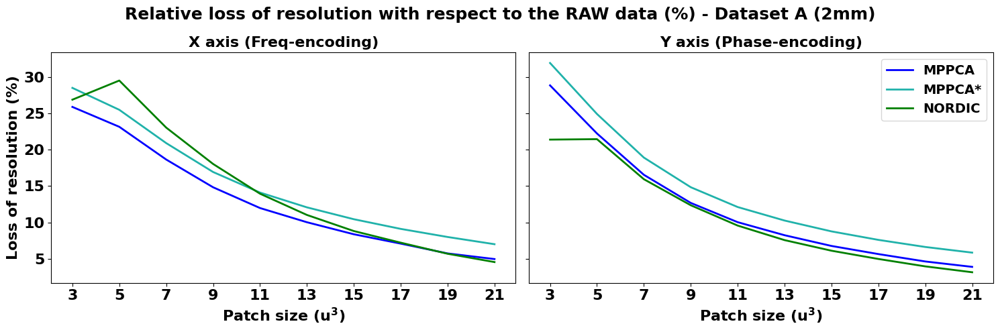

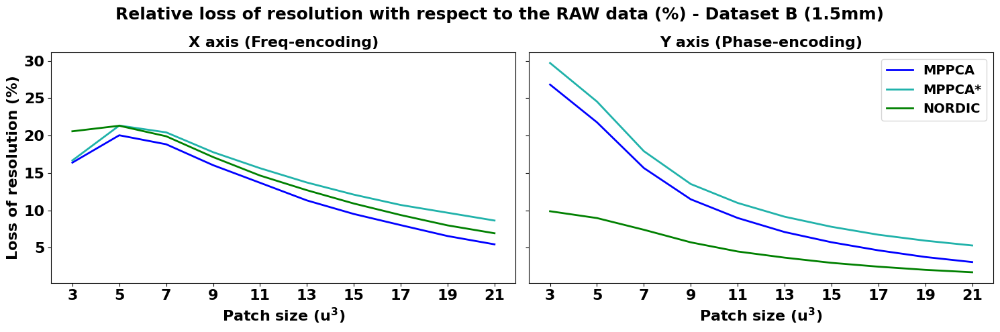

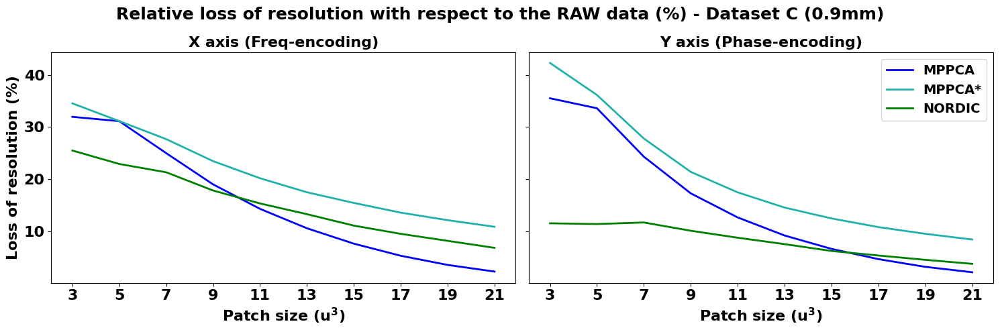

In [4]:
list_methods_aux = ['MPPCA', 'MPPCA_complex', 'NORDIC']
methods_names_aux =  ['MPPCA', 'MPPCA*', 'NORDIC']
list_colors_aux = ['blue', 'lightseagreen', 'green']

modelfit = 'dti'
list_patches = [3, 5, 7, 9, 11, 13, 15, 17, 19, 21]
for ds, dataset in enumerate(list_datasets):
    res_x = np.zeros((len(list_methods), len(list_patches))) 
    res_y = np.zeros((len(list_methods), len(list_patches)))  
    res_vol = np.zeros((len(list_methods), len(list_patches))) 
        
    fig,ax = plt.subplots(1,2, figsize=(15,5), sharex=True, sharey=True)
    # REFERENCE = RAW
    resEst, resVol = read_residuals(f'{dataPath}/{dataset}/{rep}/RAW/analysis/dMRI/processed/data/data.{modelfit}/smoothest_res.txt')
    ref_x = resEst[0]
    ref_y = resEst[1]

    for m, meth in enumerate(list_methods_aux):
        for p, patch in enumerate(list_patches):
            resFile = Path(f'{dataPath}/{dataset}/{rep}/{meth}/patchsize/{patch}/analysis/dMRI/processed/data/data.{modelfit}/smoothest_res.txt')
            resEst, resVol = read_residuals(resFile)
            res_x[m,p] = np.abs(100*(ref_x - resEst[0])/ref_x)#resEst[0]
            res_y[m,p] = np.abs(100*(ref_y - resEst[1])/ref_y)#resEst[1]

    for m, meth in enumerate(list_methods_aux):
        ax[0].plot(res_x[m,:], color=list_colors_aux[m], label=methods_names_aux[m], linewidth=2)
        ax[1].plot(res_y[m,:], color=list_colors_aux[m], label=methods_names_aux[m], linewidth=2)
        #ax[2].plot(res_vol[i,:], linestyle='dashed', marker='*', color=list_colors[ds][i], mec=list_colors[ds][i], markerfacecolor=list_colors[ds][i], markersize=10, label=methods_names[ds][i])

    for axs in ax:
        axs.set_xticks(np.arange(0, len(list_patches)))
        axs.set_xticklabels(list_patches, fontsize=16)
        axs.set_xlabel('Patch size (u$^3$)', fontsize=16, fontweight='bold')

    ax[0].tick_params(axis='y', labelsize=16)
    ax[0].set_title('X axis (Freq-encoding)', fontsize=16, fontweight='bold')
    ax[1].set_title('Y axis (Phase-encoding)', fontsize=16, fontweight='bold')
    ax[0].set_ylabel('Loss of resolution (%)', fontsize=16, fontweight='bold')
    xx = f"{modelfit}".upper()
    fig.suptitle(f'Relative loss of resolution with respect to the RAW data (%) - {dataset_names[ds]}', fontweight='bold', fontsize=18)
    plt.legend(fontsize=14)#, loc='center right', bbox_to_anchor=(1.35,0.5))
    plt.tight_layout()

## <a id='toc4_6_'></a>[Fig.8 - Patch size effect in the SNR/CNR gains](#toc4_6_)

**CAPTION**: **Figure 8. Median gains in signal quality in the white matter at different b-shells with respect to the non-denoised data (per columns) as a function of the patch-size**. Top: Dataset A (2mm); Middle: Dataset B (1.5mm); Bottom: Dataset C (0.9mm). The patch that provides the highest gains in signal quality depends on the resolution and the b-shell.*

**CAPTION**: We also performed CNR calculations for each patch-size to accompany potential spatial resolution penalties with median gains in signal quality of the white matter (Figure 8). Taken together these two figures suggest that: 1) regardless of the nominal resolution, larger patch sizes induce smaller penalties in spatial resolution after denoising, converging to the non-denoised data if the patch is big enough (this patch size will depend on the dataset and the algorithm), and 2) there is an inverted U-shape in the CNR gains suggesting that increasing the patch size after a certain point reduces denoising CNR gains. The optimal patch-size varies and the higher the b-shell (or the noisier the data is), the higher the patch size needed to provide maximum gains of CNR. 3) The patch size used in the default NORDIC implementation seems to be closer to optimal in terms of minimising spatial resolution penalty and maximising CNR gain, compared to the default MPPCA implementation used here 

**HOW TO OBTAIN**: Same as in Fig.7. The CNR maps can be obtained from the eddyqc outputs (as in Fig.2).

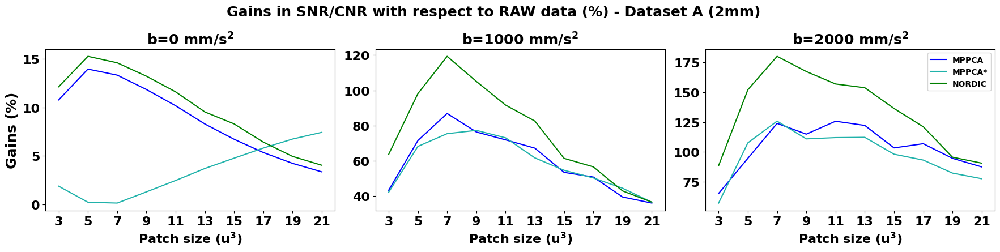

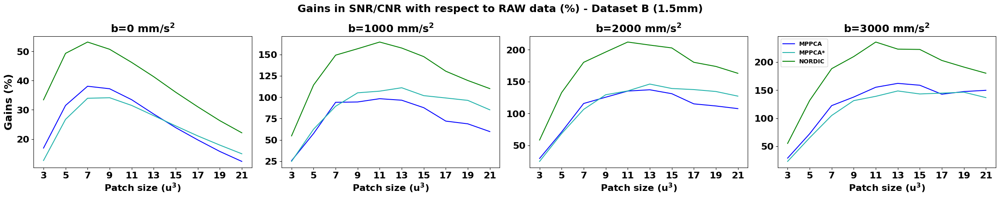

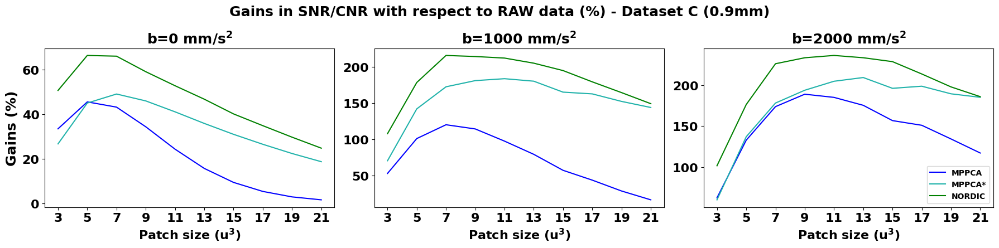

In [96]:
rep='rep1'
for ds, dataset in enumerate(list_datasets):
    mask = get_data(f'{dataPath}/{dataset}/aux/WM_mask.nii.gz', mmap=True)
    
    ncols = int(len(list_bvals[ds]))
    if dataset=='Dataset_B':
        fig, ax = plt.subplots(1, ncols, figsize=(6*ncols,1.2*ncols), sharex=True, sharey=False)
    else:
        fig, ax = plt.subplots(1, ncols, figsize=(6*ncols,1.5*ncols), sharex=True, sharey=False)
    
    ref = get_data(f'{dataPath}/{dataset}/{rep}/RAW/analysis/dMRI/preproc/eddy/eddy_unwarped_images.eddy_cnr_maps.nii.gz')
    ref_SNR = np.median(ref[:,:,:,0][mask>0].ravel())
    ref_CNR1 = np.median(ref[:,:,:,1][mask>0].ravel())
    ref_CNR2 = np.median(ref[:,:,:,2][mask>0].ravel())
    if dataset=='Dataset_B':
        ref_CNR3 = np.median(ref[:,:,:,3][mask>0].ravel())

    for m, meth in enumerate(list_methods_aux):
        list_SNR = []
        list_CNR1 = []
        list_CNR2 = []
        if dataset=='Dataset_B':
            list_CNR3 = []
        
        for patch in list_patches:
            filename = f'{dataPath}/{dataset}/{rep}/{meth}/patchsize/{patch}/analysis/dMRI/preproc/eddy/eddy_unwarped_images.eddy_cnr_maps.nii.gz'
            if os.path.exists(filename):
                cnr_maps = get_data(filename)
                list_SNR.append( np.abs(100*(ref_SNR - np.median(cnr_maps[:,:,:,0][mask>0].ravel()))/ref_SNR) )
                list_CNR1.append( np.abs(100*(ref_CNR1 - np.median(cnr_maps[:,:,:,1][mask>0].ravel()))/ref_CNR1) )
                list_CNR2.append( np.abs(100*(ref_CNR2 - np.median(cnr_maps[:,:,:,2][mask>0].ravel()))/ref_CNR2) )
                if dataset=='Dataset_B':
                    list_CNR3.append( np.abs(100*(ref_CNR3 - np.median(cnr_maps[:,:,:,3][mask>0].ravel()))/ref_CNR3) )
            else:
                list_SNR.append(np.nan)
                list_CNR1.append(np.nan)
                list_CNR2.append(np.nan)
                if dataset=='Dataset_B':
                    list_CNR3.append(np.nan)
                
        ax[0].plot(list_SNR, color=list_colors_aux[m], label=methods_names_aux[m])
        ax[1].plot(list_CNR1, color=list_colors_aux[m], label=methods_names_aux[m])
        ax[2].plot(list_CNR2, color=list_colors_aux[m], label=methods_names_aux[m])
        if dataset=='Dataset_B':
            ax[3].plot(list_CNR3, color=list_colors_aux[m], label=methods_names_aux[m])
            ax[3].set_title(f'b=3000 mm/s$^2$', fontweight='bold', fontsize=18)

    ax[0].set_ylabel('Gains (%)', fontsize=18, fontweight='bold')
    ax[0].set_title(f'b=0 mm/s$^2$', fontweight='bold', fontsize=18)
    #ax[1].set_ylabel('CNR', fontsize=14, fontweight='bold')
    ax[1].set_title(f'b=1000 mm/s$^2$', fontweight='bold', fontsize=18)
    ax[2].set_title(f'b=2000 mm/s$^2$', fontweight='bold', fontsize=18)
        
    for axs in ax:
        axs.set_xticks(np.arange(0, len(list_patches)))
        axs.set_xticklabels(list_patches, fontsize=16)
        axs.set_xlabel('Patch size (u$^3$)', fontsize=16, fontweight='bold')
        axs.tick_params(axis='y', labelsize=16)
    plt.legend()#methods_names, loc='upper right')
    plt.suptitle(f'Gains in SNR/CNR with respect to RAW data (%) - {dataset_names[ds]}', fontsize=20, fontweight='bold')
    plt.tight_layout()
    plt.show()

## <a id='toc4_3_'></a>[Fig.Extra(I) - Validity of residuals assumption](#toc4_3_)

*This figure is not included in the manuscript but we added here as extra results checked during the experiments.*

The validity of the *resels* approach relies on the assumption that data follows a 0-mean gaussian distribution, hence applying it to the DTI/DKI model fit residuals rather than directly to the data (the dtifit is ). Here we visualise such residuals for different datasets and patch sizes to verify that they hold the assumption.

In [ ]:
for ds, dataset in enumerate(list_datasets):
    mask = get_data(f'{dataPath}/{dataset}/aux/nodif_brain_mask_ero.nii.gz', mmap=True)[:,:,60]
    
    fig, ax = plt.subplots(2, 2, figsize=(15,5), sharex=True, sharey=True)
    for axs in ax.flatten():
        axs.axvline(x=0, lw=2, ls='--', color='black')
    
    if dataset=='Dataset_B':
        dkifile = 'dki_nob3k_residuals.nii.gz'
    else:
        dkifile = 'dki_residuals.nii.gz'

    for m, meth in enumerate(list_methods[1:]):
        residuals_dti_5 = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/patchsize/5/analysis/dMRI/processed/data/data.dti/dti_residuals.nii.gz')[:,:,60]
        residuals_dki_5 = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/patchsize/5/analysis/dMRI/processed/data/data.dki/{dkifile}')[:,:,60]
        sns.kdeplot(residuals_dti_5[mask>0].ravel(), color=list_colors[m+1], ax=ax[0,0], fill=False, linewidth=2, common_norm=True, common_grid=True, legend=True)
        sns.kdeplot(residuals_dki_5[mask>0].ravel(), color=list_colors[m+1], ax=ax[1,0], fill=False, linewidth=2, common_norm=True, common_grid=True, legend=True)

        if meth=='NLM':
            pass
        else:
            residuals_dti_19 = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/patchsize/19/analysis/dMRI/processed/data/data.dti/dti_residuals.nii.gz')[:,:,60]
            residuals_dki_19 = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/patchsize/19/analysis/dMRI/processed/data/data.dki/{dkifile}')[:,:,60]
            sns.kdeplot(residuals_dti_19[mask>0].ravel(), color=list_colors[m+1], ax=ax[0,1], fill=False, linewidth=2)
            sns.kdeplot(residuals_dki_19[mask>0].ravel(), color=list_colors[m+1], ax=ax[1,1], fill=False, linewidth=2)

    
    ax[0,0].set_ylabel('DTI', fontsize=16, fontweight='bold')
    ax[1,0].set_ylabel('DKI', fontsize=16, fontweight='bold')
    ax[0,0].set_title('Patch=7', fontsize=16, fontweight='bold')
    ax[0,1].set_title('Patch=19', fontsize=16, fontweight='bold')
    plt.xlim([-500,500])
    plt.legend(methods_names[1:], fontsize=14)
    plt.suptitle(f'Model Residuals - {dataset_names[ds]}', fontsize=20, fontweight='bold')
    plt.tight_layout()
    plt.show()

## <a id='toc4_7_'></a>[Fig.Extra(II) - Patch size effect in the noise floor](#toc4_7_)
*This figure is not included in the manuscript but we added here as extra results checked during the experiments.*

Similar to before, the following figure shows the effect of the patch size in the noise floor. The noise floor is defined as the mode of the distribution in the ventricles (noise distribution). As expected, the patch size has no influence on the noise floor.

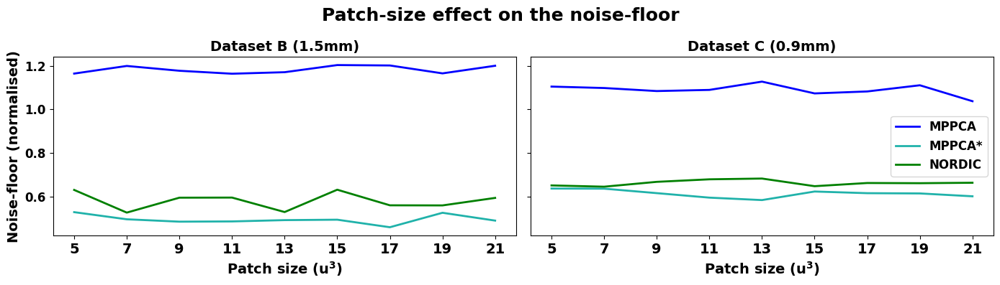

In [ ]:
list_datasets_aux = ['Dataset_B', 'Dataset_C']
dataset_names_aux = ['Dataset B (1.5mm)', 'Dataset C (0.9mm)']
list_patches = [3, 5, 7, 9, 11, 13, 15, 17, 19, 21]

fig,ax = plt.subplots(1,2, figsize=(14,4), sharex=True, sharey=True)
for ds, dataset in enumerate(list_datasets_aux):
    noise_floor = np.zeros((len(list_methods_aux), len(list_patches_aux))) 
    ts_csf_ref = np.loadtxt(f'{dataPath}/{dataset}/{rep}/RAW/analysis/dMRI/processed/data/ts_CSF.txt')
    hist, bin_edges = np.histogram(ts_csf_ref[ts_csf_ref>10], bins=1500)
    max_bin = np.argmax(hist)
    noise_floor_ref = (bin_edges[max_bin] + bin_edges[max_bin+1])/2    # x_peak
    for m, meth in enumerate(list_methods_aux):
        for p, patch in enumerate(list_patches):
            if (meth=='NLM_nonrician' and patch>11):
                noise_floor[m,p] = np.nan
            else:
                ts_csf = np.loadtxt(f'{dataPath}/{dataset}/{rep}/{meth}/patchsize/{patch}/analysis/dMRI/processed/data/ts_CSF.txt')
                # Find the maximum of the histogram
                hist, bin_edges = np.histogram(ts_csf[ts_csf>10], bins=1500)
                max_bin = np.argmax(hist)
                x_peak = (bin_edges[max_bin] + bin_edges[max_bin+1])/2    # x_peak
                noise_floor[m,p] = x_peak/noise_floor_ref

    for m, meth in enumerate(list_methods_aux):
        ax[ds].plot(noise_floor[m,:], color=list_colors_aux[m], label=methods_names_aux[m], linewidth=2)

    ax[ds].set_xticks(np.arange(0, len(list_patches)))
    ax[ds].set_xticklabels(list_patches, fontsize=14)
    ax[ds].set_xlabel('Patch size (u$^3$)', fontsize=14, fontweight='bold')
    ax[ds].tick_params(axis='y', labelsize=12)
    ax[ds].set_title(dataset_names_aux[ds], fontsize=14, fontweight='bold')
ax[0].set_ylabel('Noise-floor (normalised)', fontsize=14, fontweight='bold')
fig.suptitle(f'Patch-size effect on the noise-floor', fontweight='bold', fontsize=18)
plt.legend(fontsize=12)#, loc='center right', bbox_to_anchor=(1.35,0.5))
plt.tight_layout()
plt.show()

## <a id='toc4_8_'></a>[Suppl.Fig.8 - Patch size effect in NLM denoised data](#toc4_8_) 

# <a id='toc5_'></a>[**Consideration 5 - Denoising should provide gains in model parameter estimation for both precision and accuracy**](#toc5_)

As denoising should inherently reduce noise variance and noise floor, downstream gains should be expected in dMRI biophysical model estimation for parameter precision and accuracy. We explicitly explored improvements in model parameter accuracy by directly comparing DTI model estimates obtained from the non-denoised and the different denoised datasets, against the respective gold standard ones obtained using the complex average (AVG*). Since we have multiple repeats, we performed the accuracy evaluations across these independent repeats. We also assessed the precision of estimation, by using residual-based bootstrap to calculate the uncertainty of estimated parameters. We specifically used the wild bootstrap (Whitcher et al., 2008) that considers heteroscedasticity in the log-transformed signal, used for ordinary least squares fit of the DTI model, and permutes residuals in-situ. We obtained 250 bootstrap samples and assessed the uncertainty of model parameters across these.

To run bootstrapping, you first need to have a dtifit already computed. Then, in the terminal:
```
for dataset in Dataset_A Dataset_B Dataset_C; do
mask=/home/data/Denoising/data/${dataset}/aux/nodif_brain_mask_ero.nii.gz
for meth in RAW NLM MPPCA MPPCA_complex NORDIC AVG_mag AVG_complex; do
dPath=/home/data/Denoising/data/${dataset}/rep1/${meth}/analysis/dMRI/processed/data
nohup python ${CODEDIR}/wild_bootstrapping_residuals.py ${dPath}/data.dti/dti_pred.nii.gz ${dPath}/data.dti/dti_residuals.nii.gz ${dPath}/data.dti/data_b1k.bval ${dPath}/data.dti/data_b1k.bvec ${dPath}/data.dti_wild_bootstrap/ ${mask} 1 250 &
done 
done
```

In [3]:
list_methods_aux = ['RAW', 'MPPCA', 'MPPCA_complex', 'NORDIC']
methods_names_aux =  ['RAW', 'MPPCA', 'MPPCA*', 'NORDIC']
list_colors_aux = ['gold','blue', 'lightseagreen', 'green']
list_maps = ['FA', 'MD']
xvalues = np.arange(len(list_methods))

## <a id='toc5_1'></a>[**Fig.9A - Accuracy of DTI estimates**](#toc5_1)

*Caption: **Figure 9. Precision and accuracy in DTI model estimates**. A) Accuracy in FA and MD from non-denoised and denoised data is evaluated against FA and MD estimated using the complex average (AVG*) of multiple repeats. Plots show correlation values within WM. Different dots represent one of the repeats (5 for dataset B and 4 for dataset C). This is shown for different exemplar scenarios: Dataset B (1.5mm resolution) with 30 b=1000 s/mm2 volumes (top); Dataset C (0.9mm resolution) with 30 b=1000 s/mm2 volumes (middle); Dataset C with 90 b=1000 s/mm2 volumes.*

We evaluated whether denoising gains in SNR/CNR (Figure 2) and behaviour against noise floor effects (Figures 3, 5) were translated into downstream improvements in precision and accuracy of model estimates respectively. For the accuracy evaluation, Figure 9A shows the correlation between DTI estimates (FA and MD) obtained from different repeats of denoised and non-denoised data against those obtained using the complex-average (AVG*), assuming the latter represent a gold standard. Both MPPCA* and NORDIC show substantial improvements across all tested datasets with respect to the non-denoised data. Of interest is the behaviour of |MPPCA| that, particularly for MD in a very noisy scenario (Dataset C), does not converge to the gold standard and offers reduced benefits compared to non-denoised data. This is indicative of the noise floor effects, discussed in the previous sections, which are reduced when denoising in the complex domain, but remain high when denoising in the magnitude domain. 

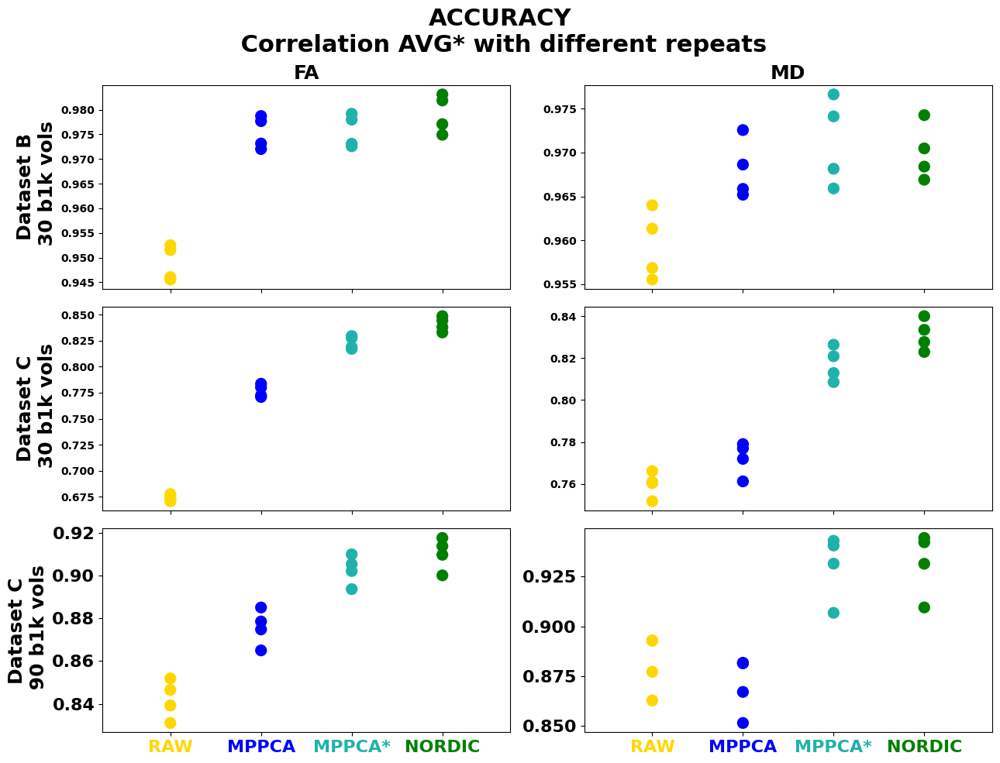

In [40]:
dataset_aux = ['Dataset_B', 'Dataset_C', 'Dataset_C']
set_aux = ['data_30dirs', 'data_30dirs', 'data']
names_aux = ['Dataset B\n 30 b1k vols', 'Dataset C\n 30 b1k vols', 'Dataset C\n 90 b1k vols']
fig, ax = plt.subplots(len(dataset_aux), len(list_maps), figsize=(13,10), sharex=True, sharey=False)

for i in range(0,len(set_aux)):
    mask = get_data(f'{dataPath}/{dataset_aux[i]}/aux/WM_mask.nii.gz')
    for f, feature in enumerate(list_maps):
        ref = get_data(f'{dataPath}/{dataset_aux[i]}/rep1/AVG_complex/analysis/dMRI/processed/data/data.dti/dti_{feature}.nii.gz')[mask>0].ravel()
        for r, rep in enumerate(list_reps[ds]):
            corrvalues = []#np.zeros((len(list_methods), len(list_reps)))
            for m, meth in enumerate(list_methods_aux):
                data = get_data(f'{dataPath}/{dataset_aux[i]}/CONCATENATED/{rep}/{meth}/analysis/dMRI/processed/{set_aux[i]}/data.dti/dti_{feature}.nii.gz')[mask>0].ravel()
                corrvalues.append(np.corrcoef(ref,data)[0,1])
            ax[i,f].scatter(np.arange(1,len(corrvalues)+1), corrvalues, c=list_colors_aux, s=100)
    ax[i,0].set_ylabel(names_aux[i], fontweight='bold', fontsize=18)

labels = methods_names_aux
for axs in ax[-1,:]:
    set_axis_style(axs, labels, 24)
    y_ticks = axs.get_yticklabels()
    axs.tick_params(axis='y', labelsize=16)
    for c, label in enumerate(axs.get_xticklabels()):
        label.set_color(list_colors_aux[c])
        label.set_size(16)

ax[0,0].set_title(f'FA', fontweight='bold', fontsize=18)
ax[0,1].set_title(f'MD', fontweight='bold', fontsize=18)

plt.suptitle('ACCURACY\n Correlation AVG* with different repeats', fontweight='bold', fontsize=22)
fig.tight_layout()
plt.show()

A further evaluation of this is performed by comparing the MD in the ventricles for the different methods, where the self-diffusion coefficient of water in a barrier-free medium at body temperature is anticipated to be $\approx 3\cdot10^{-3}$ mm2/s. For Dataset C, we can achieve a significant reduction of the noise floor by denoising that translates to an ~30% increase of the ADC in the ventricles. 

In [48]:
# To extract the intensity values from the ventricles in the MD maps, just use fslmeants again:
    #for meth in RAW NLM MPPCA MPPCA_complex NORDIC AVG_mag AVG_complex; do
        #mask=~/data/Dataset_C/aux/ventricles_mask.nii.gz
        #dPath=~/Dataset_C/rep1/${meth}/analysis/dMRI/processed/data
        #fslmeants -i ${dPath}/data.nii.gz -o ${dPath}/ts_CSF.txt -m ${mask} --showall &
    #done

print('Median diffusivity (+-std) in the ventricles:')
data_aux = []
for meth in ['MPPCA','MPPCA_complex', 'NORDIC', 'AVG_mag', 'AVG_complex']:
    data_aux.append(np.loadtxt(f'{dataPath}/Dataset_C/rep1/{meth}/analysis/dMRI/processed/data/data.dti/ts_MD.txt')[3:].ravel())
    print(f'{meth}={np.round(np.median(complex),4)} (+-{np.round(np.std(complex),4)})')


Median diffusivity (+-std) in the ventricles:
NLM=0.0027 (=-0.0003)
|MPPCA|=0.0021 (=-0.0002)
MPPCA*=0.0027 (=-0.0003)
NORDIC=0.0027 (=-0.0003)
|AVG|=0.0021 (=-0.0002)
AVG*=0.0027 (=-0.0003)


## <a id='toc5_2'></a>[**Fig.9B - Precision of DTI estimates**](#toc5_2_)

*Caption: **Figure 9. Precision and accuracy in DTI model estimates**. B) Precision in FA and MD evaluated using wild residual bootstrap. The uncertainty (inverse precision) in the FA and MD estimates is calculated as the standard deviation across 250 bootstrap samples.*

For the precision evaluation, Figure 9B represents the uncertainty of DTI estimates across two different datasets,  calculated using bootstrapping. The trends demonstrate that the denoising benefits in SNR/CNR shown before (Figure 2) translate to uncertainty decrease / precision increase in both FA and MD, compared to non-denoised data. Improvements are at least two-fold in most cases following the almost two-fold average CNR increase of the b=1000 data in Datasets B and C after denoising. 


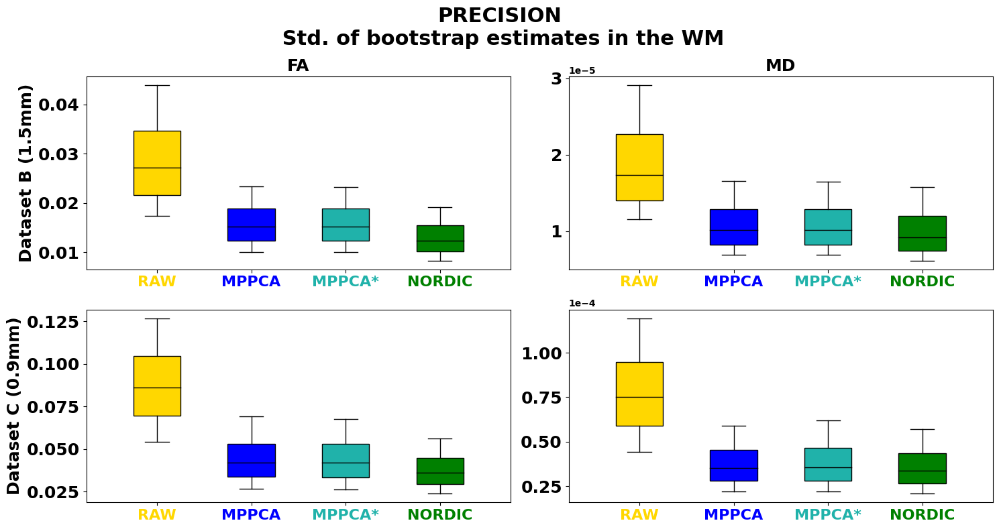

In [56]:
fig, ax = plt.subplots(2,2, figsize=(15,8), sharex=True, sharey=False)
for ds, dataset in enumerate(list_datasets):
    if ds==0: 
        pass
    else:
        mask = get_data(f'{dataPath}/{dataset}/aux/WM_mask.nii.gz')
        for f, feature in enumerate(['FA', 'MD']):
            list_data = []
            list_maps = []
            data_hdr = nb.load(f'{dataPath}/{dataset}/rep1/RAW/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
            for meth in list_methods_aux:
                aux = []
                # Run the commented code the first time to stack all the wild bootstraps in the same file
                #for i in range(1,251):
                #    aux.append(get_data(f'{dataPath}/{dataset}/rep1/{meth}/analysis/dMRI/processed/data/data.dti_wild_bootstrap/{i}/dti_{feature}.nii.gz'))
                #aux_array = np.stack(aux, axis=3)
                #export_nifti(aux_array, data_hdr, f'{dataPath}/{dataset}/rep1/{meth}/analysis/dMRI/processed/data/data.dti_wild_bootstrap/', f'std_{feature}')
                aux_array = get_data(f'{dataPath}/{dataset}/rep1/{meth}/analysis/dMRI/processed/data/data.dti_wild_bootstrap/std_{feature}.nii')
                list_maps.append(np.std(aux_array, 3))
                list_data.append(np.std(aux_array, 3)[mask>0].ravel())

            bpx = ax[ds-1,f].boxplot(list_data, **boxparams)

            for patch, color in zip(bpx['boxes'], list_colors_aux):
                patch.set_facecolor(color)
                labels = methods_names_aux

        for axs in ax[ds-1,:]:
            set_axis_style(axs, labels)
            y_ticks = axs.get_yticklabels()
            axs.tick_params(axis='y', labelsize=18)
            for c, label in enumerate(axs.get_xticklabels()):
                label.set_color(list_colors_aux[c])
                label.set_size(16)

        ax[ds-1,0].set_ylabel(f'{dataset_names[ds]}', fontweight='bold', fontsize=18)

ax[0,0].set_title(f'FA', fontweight='bold', fontsize=18)
ax[0,1].set_title(f'MD', fontweight='bold', fontsize=18)
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
plt.suptitle('PRECISION\n Std. of bootstrap estimates in the WM', fontweight='bold', fontsize=22)
fig.tight_layout()

# <a id='toc6_'></a>[**Consideration 6 - Denoising should not be detrimental to subsequent processing and performance should converge at the high SNR limit**](#toc6_)

As with any pre-processing approach, denoising algorithms should converge to the limit of high SNR (i.e., where denoising is not really needed), offering larger benefits for low SNR data compared to benefits for high SNR data. Denoising should not be detrimental to any subsequent processing and such convergence provides evidence towards this direction. Data and metrics that converge with and without denoising in the absence of high noise are indicative of a well-conditioned algorithm. Our datasets provide a range of SNR/CNRs, with the 2mm isotropic, multi-shell data (Dataset A) representing what a modern clinical scanner can nowadays provide using bog-standard acquisition choices. This can be considered as mid to high SNR, where denoising is expected to provide fewer gains than for instance bespoke, ultra-high resolution data (Dataset C). We explored convergence in two ways: 

## <a id='toc6_1_'></a>[Fig.10A - Convergence of signal gains at high SNR](#toc6_1_)

*Caption: **Figure 10. Convergence of performance with higher SNR**. Gains in denoising performance for different SNR examples (low, medium and high SNR) are presented. A) Percentage change of median CNR (per b-shell) after denoising with respect to the angular CNR of the raw data.*


A) Using raw signal quality metrics. For each denoising approach, we explored how the CNR gain (before and after denoising) at b = 1000 and b = 2000 s/mm2 changed with increasing voxel volume. As our data had higher SNR at low resolution, we expected the CNR gains to decrease with voxel volume. 

We show the gains in the median SNR and angular CNR by denoising compared to raw data, as we move from low SNR (dataset C) to medium SNR (dataset B) and high SNR (dataset A). NORDIC provides the largest benefits overall, nevertheless, all methods show greater benefits for the lowest SNR dataset and for the highest b-value; and the smallest benefits for the highest SNR dataset and lowest b-value. 

In [ ]:
# CONVERGENCE IN TERMS OF CNR
export_figures = True

list_datasets = ['Dataset_A', 'Dataset_B', 'Dataset_C']
name_datasets = ['Dataset A', 'Dataset_B', 'Dataset C']
list_methods = ['NLM', 'MPPCA',  'MPPCA_complex', 'NORDIC']
methods_names =  ['NLM', '|MPPCA|', 'MPPCA*', 'NORDIC']
list_colors = ['pink', 'blue', 'lightseagreen', 'green']


ref_SNR = []
ref_CNR1 = []
ref_CNR2 = []
SNR_rel = np.zeros((len(list_datasets), len(list_methods)))
CNR1_rel = np.zeros((len(list_datasets), len(list_methods)))
CNR2_rel = np.zeros((len(list_datasets), len(list_methods)))

for ds, dataset in enumerate(list_datasets):
    mask = get_data(f'{dataPath}/{dataset}/aux/WM_mask.nii.gz', mmap=True)
    ref_cnr_maps = get_data(f'{dataPath}/{dataset}/{rep}/RAW/analysis/dMRI/preproc/eddy/eddy_unwarped_images.eddy_cnr_maps.nii.gz')
    ref_SNR.append(np.median(ref_cnr_maps[:,:,:,0][mask>0].ravel()))
    ref_CNR1.append(np.median(ref_cnr_maps[:,:,:,1][mask>0].ravel()))
    ref_CNR2.append(np.median(ref_cnr_maps[:,:,:,2][mask>0].ravel()))
    
    for m, meth in enumerate(list_methods):
        cnr_maps = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/preproc/eddy/eddy_unwarped_images.eddy_cnr_maps.nii.gz')
        SNR_rel[ds,m] = 100*(np.median(cnr_maps[:,:,:,0][mask>0].ravel())/ref_SNR[ds])
        CNR1_rel[ds,m] = 100*(np.median(cnr_maps[:,:,:,1][mask>0].ravel())/ref_CNR1[ds])
        CNR2_rel[ds,m] = 100*(np.median(cnr_maps[:,:,:,2][mask>0].ravel())/ref_CNR2[ds])


SNR_rel = SNR_rel[::-1]    # Just to reverse the order and starts from the 0.9mm data
CNR1_rel = CNR1_rel[::-1]   
CNR2_rel = CNR2_rel[::-1]
nrows = 1
ncols = 2
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8*ncols, 5*nrows), sharex=True, sharey=False)
for i in range(0,len(list_methods)):
    #ax[0].plot(SNR_rel[:,i], linestyle='dashed', marker='o', color=list_colors[i], mec=list_colors[i], markerfacecolor=list_colors[i], markersize=14, label=methods_names[i])
    ax[0].plot(CNR1_rel[:,i], linestyle='dashed', marker='o', color=list_colors[i], mec=list_colors[i], markerfacecolor=list_colors[i], markersize=14, label=methods_names[i])
    ax[1].plot(CNR2_rel[:,i], linestyle='dashed', marker='o', color=list_colors[i], mec=list_colors[i], markerfacecolor=list_colors[i], markersize=14, label=methods_names[i])


#ax[0].set_title('SNR', fontweight='bold', fontsize=16)
ax[0].set_ylabel('Gains (%)', fontweight='bold', fontsize=16)
ax[0].set_title('CNR (b=1000 mm/s$^2$)', fontweight='bold', fontsize=16)
ax[1].set_title('CNR (b=2000 mm/s$^2$)', fontweight='bold', fontsize=16)
plt.suptitle('Convergence of gains in CNR', fontweight='bold', fontsize=18)
for axs in ax:
    axs.set_xticks(np.arange(0, 3))
    axs.set_xticklabels(['Dataset C \n Low SNR','Dataset B','Dataset A \n High SNR'], fontsize=16)
    #axs.set_xlabel('Decreasing Resol./Increasing SNR', fontsize=16, fontweight='bold')#supxlabel('SNR', fontsize=16, fontweight='bold',)

plt.legend(prop={'size': 12})
if export_figures:
    plt.savefig(f'{figsPath}/4A_{dataset}_CNR_convergence.png', dpi=fig.dpi, bbox_inches='tight')
    #plt.close()


## <a id='toc6_1_'></a>[**Fig.10B - Convergence of tractography performance at high SNR**](#toc6_2_)

*Caption: **Figure 10. Convergence of performance with higher SNR.** Gains in denoising performance for different SNR examples (low, medium and high SNR) are presented. B) Spatial tract correlation across 42 bundles with the tracts obtained from the complex average for the low resolution/high SNR data (left) and the high resolution/low SNR data (right).*

B) Using imaging-derived features. We used data before and after denoising to perform standardised tractography of 42 bundles (Warrington et al., 2020). Using the AVG* as a reference, we then calculated the agreement between the reference tracts and the ones produced after different denoising methods. We did so by computing for each tract the Pearson correlation of the respective path distribution maps (vectorised, after thresholding to voxels with path probabilities higher than 0.5% within a mask given by the same tract estimated with the AVG* data). We calculated this for datasets A and C. We anticipated smaller benefits for the high-SNR Dataset A, compared to lower SNR Dataset C. 

The bottom figure shows a similar pattern of tractography performance convergence evaluated against tractography results obtained using the complex average data (AVG*). Agreement with the gold standard improves substantially after denoising compared to raw data in the low SNR case. Denoising has effectively no effect in higher SNR data (in fact NLM slightly decreases performance compared to raw data). Taken together, these results suggest convergence of the denoising performance at the high-SNR regime, with complex denoising approaches performing better overall for noisier data. 

In [ ]:
# CONVERGENCE IN TERMS OF SPATIAL TRACT CORRELATION

list_methods = ['RAW', 'NLM', 'MPPCA',  'MPPCA_complex', 'NORDIC']
methods_names =  ['RAW', 'NLM', '|MPPCA|', 'MPPCA*', 'NORDIC']
list_colors = ['gold', 'pink', 'blue', 'lightseagreen', 'green']
list_datasets = ['Dataset_A', 'Dataset_B', 'Dataset_C']
name_datasets = ['Dataset A', 'Dataset B', 'Dataset C']

rep = 'rep1'  # For simplicity, we only show gains from the first repetition data. The other reps provide similar results
list_tracts = []
with open(f'{CODEDIR}/list_tracts.txt', 'r') as fileobj:
    [ list_tracts.append(row.rstrip('\n')) for row in fileobj ]

medianCorr = np.zeros((len(list_datasets), len(list_methods)))
for ds, dataset in enumerate(list_datasets):
    reconTracts = pd.DataFrame(index=list_tracts, columns=list_methods)
    tractsCorr = pd.DataFrame(index=list_tracts, columns=list_methods)
    for m, meth in enumerate(list_methods):
        reconTracts[meth], tractsCorr[meth] = get_missingTracts(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed')

    # Median correlation of each method
    medianCorr[ds,:] = np.median(tractsCorr, axis=0)
    
    # Boxplots
    fig, ax = plt.subplots(1,1,figsize=(8,5))
    plt.axhline(y=medianCorr[ds,0], color='k', linestyle='--')
    bpx = plt.boxplot(tractsCorr, **boxparams)
    for patch, color in zip(bpx['boxes'], list_colors):
        patch.set_facecolor(color)
    labels = methods_names
    set_axis_style(ax, labels, fontsize=16)
    for c, label in enumerate(ax.get_xticklabels()):
        label.set_color(list_colors[c])

    ax.set_ylim([0.0, 1.0])
    ax.tick_params(axis='y', labelsize=14)
    ax.set_ylabel('Correlation', fontweight='bold', fontsize=14)
    plt.suptitle(name_datasets[ds], fontweight='bold', fontsize=16)
    fig.tight_layout()
    # Export results
    tractsCorr.to_csv(f'{figsPath}/4_{dataset}_tractCorr.csv', index=True)
    reconTracts.to_csv(f'{figsPath}/4_{dataset}_reconTracts.csv', index=True)
    if export_figures:
        plt.savefig(f'{figsPath}/4_{dataset}_tractCorr.png', dpi=fig.dpi, bbox_inches='tight')


medianCorr_rel = 100*(medianCorr[:,1:]-medianCorr[:,0:1])/medianCorr[:,0:1]
medianCorr_rel = medianCorr_rel[::-1]   # Just to reverse the order and starts from the 0.9mm data
nrows = 1
ncols = 1   
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8*ncols, 5*nrows), sharex=True, sharey=False)
for i in range(0,len(list_methods[1:])):
    plt.plot(medianCorr_rel[:,i], linestyle='dashed', marker='o', color=list_colors[i+1], mec=list_colors[i+1], markerfacecolor=list_colors[i+1], markersize=14, label=methods_names[i+1])


plt.ylabel('Gains (%)', fontweight='bold', fontsize=14)
plt.title('Gains in Tract spatial correlation', fontweight='bold', fontsize=16)

ax.set_xticks(np.arange(0, 3))
ax.set_xticklabels(['Low','Medium','High'], fontsize=16)
ax.set_xlabel('SNR', fontsize=16)
        
plt.legend()
if export_figures:
    plt.savefig(f'{figsPath}/4A_{dataset}_tract_convergence.png', dpi=fig.dpi, bbox_inches='tight')


# <a id='toc7_'></a>[**Consideration 7 - Denoising should be transformative in allowing SNR-limited applications that are otherwise infeasible (e.g.at ultra-high spatial resolution**](#toc7_)

A denoising algorithm should ideally provide gains that are transformative enough in SNR-limited applications. We explored performance in two such scenarios: a) enabling ultra-high spatial resolution imaging or b) reducing scan time by utilising the higher effective SNR per unit time that is expected by denoising (Kawamura et al., 2021).


## <a id='toc7_0_1'></a>[**Benefits for pushing spatial resolution**](#toc7_0_1)
Firstly, we explored how an approach that relies on consistent quality across the whole brain, like tractography, can operate in the ultra-high resolution (and very noisy) data (Dataset C), before and after denoising. We explored whether we can reconstruct a range of WM bundles, from association, limbic to projection and commissural fibres, that all demonstrate different level of complexity along their route, using the raw and denoised data.

In the previous figure, we showed that denoising had a large effect on tractography performance for the ultra-high resolution dataset. Acknowledging that a 0.9mm isotropic dMRI dataset acquired with a conventional PGSE sequence in a clinical scanner is borderline unusable in most cases, we considered tractography using such data as a challenging scenario. We, therefore, explored what difference denoising methods can make in a demanding application.

We first looked at sensitivity in estimating fibre orientations. Figure 11A in the paper (done using FSLEYES)  demonstrates how multi-way crossings in the Centrum Semiovale (a region where most of the voxels are expected to have at least two fibre bundles crossing) can be recovered after denoising in the 0.9mm data. NORDIC provides overall higher rates of detection of secondary and third fibres at 0.9mm resolution, although both MPPCA algorithms also show considerable improvements over raw data.

## <a id='toc7_1'></a>[**Fig.11B - Rate of crossing-fibres detected in the Centrum Semiovale**](#toc7_1)

As previously shown (Figure 9), precision is also improved by denoising (here uncertainty in fibre orientation is assessed by MCMC on the ball & sticks model, focusing on a region where most voxels are expected to exhibit a single fiber, the midbody of the Corpus Callosum). 


In [ ]:
# CROSSINGS
rep='rep1'
list_datasets = ['Dataset_C']
name_datasets = ['Dataset C (0.9mm)']
list_methods = ['RAW', 'MPPCA', 'MPPCA_complex', 'NORDIC']
methods_names =  ['RAW', '|MPPCA|', 'MPPCA*', 'NORDIC']
list_colors = ['gold', 'blue', 'lightseagreen', 'green']
custom_palette = sns.color_palette(list_colors) # To get the same color palette than in seaborn

for ds, dataset in enumerate(list_datasets):
    rows = [f'f{f}' for f in range(2, 4)]
    cols = methods_names
    thr = 0.05
    mask = get_data(f'{dataPath}/{dataset}/aux/CR_mask.nii.gz')
    fig, ax = plt.subplots(1,2 , figsize=(4*len(list_methods), 6), sharex=True, sharey=False)
    x = np.arange(len(list_methods))
    for fib in range(0, len(rows)):
        f_arr = []
        name_arr = []
        #ax[fib].set_title(f'f{fib + 2}', fontsize=16, weight='bold')
        ax[fib].set_ylabel(f'f{fib + 2}-way crossings (%) > 0.05', fontsize=20, weight='bold')
        for meth in list_methods:
            f = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data.bedpostX/mean_f{fib + 2}samples.nii.gz')
            f_arr.append(100*np.count_nonzero((f > 0.05) & (mask>0))/np.count_nonzero(mask>0))
        ax[fib].bar(x, f_arr, width=0.70, color=custom_palette, align='center')
        ax[fib].set_xticks(x)
        ax[fib].set_xticklabels(methods_names)
        ax[fib].spines[['right', 'top']].set_visible(False)
        ax[fib].tick_params(axis='x', labelsize=18)
        ax[fib].tick_params(axis='y', labelsize=18)
        for c, label in enumerate(ax[fib].get_xticklabels()):
            label.set_color(list_colors[c])

    plt.show()

## <a id='toc7_2'></a>[**Fig.11C - First fibre uncertainty in the Corpus Callosum**](#toc7_2)


In [ ]:
## UNCERTAINTY
list_datasets = ['Dataset_C']
list_methods = ['RAW', 'MPPCA',  'MPPCA_complex', 'NORDIC']
methods_names =  ['RAW', '|MPPCA|',  'MPPCA*', 'NORDIC']
list_colors = ['gold', 'blue', 'lightseagreen', 'green']
ylim = [[0,0.010],[0,0.10]]
ylim = [[0,0.15]]
for ds, dataset in enumerate(list_datasets):
    disp_masked = []
    mask = get_data(f'{dataPath}/{dataset}/aux/CC_mask.nii.gz')
    for m, meth in enumerate(list_methods):
        disp = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data.bedpostX/dyads1_dispersion.nii.gz')
        disp_masked.append(disp[mask>0].ravel())
    fig, ax = plt.subplots(1,1, figsize=(10,5))
    bpx = plt.boxplot(disp_masked, **boxparams)
    for patch, color in zip(bpx['boxes'], list_colors):
        patch.set_facecolor(color)
    labels = methods_names
    set_axis_style(ax, labels)
    for c, label in enumerate(ax.get_xticklabels()):
        label.set_color(list_colors[c])
    ax.set_ylabel('Uncertainty', fontsize=20, weight='bold')
    ax.spines[['right', 'top']].set_visible(False)
    ax.set_ylim(ylim[ds])
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    fig.tight_layout()

We subsequently looked in greater detail at tractography success at this low SNR regime. Figure 12 demonstrates the tractography of 42 major white matter bundles (Warrington et al., 2020) in the raw vs denoised data. A number of tracts could not be reconstructed at all using the raw data (seven bundle tracts in total, including the left Acoustic Radiation, left and right Corticospinal Tracts, right Fornix, Middle Cerebellar Peduncle, and left and right Superior Longitudinal Fasciculus 1). Denoising allowed good reconstruction of all considered WM tracts, apart from the Middle Cerebellar Peduncle in MPPCA and NLM, and of all 42 tracts for NORDIC. As shown in Figure 10B, all denoising methods improved the agreement of tractography results with the HCP Atlas, compared to the raw data. Denoising in the complex domain also showed the highest improvement and was closest to the tracts reconstructed with the higher-SNR, 2mm dataset.

## <a id='toc7_0_2'></a>[**Benefits for reducing scanning time**](#toc7_2)

Denoising inherently aims to improve the effective SNR per sample. This opens the question of whether scan time can be reduced, i.e., whether acquiring fewer denoised volumes is equivalent to acquiring many noisy volumes. We obtained 6 subsets of the original raw data with fewer directions (roughly 15, 35, 50, 65, 80, 100% of the original set of directions) in Datasets B and C. We performed denoising and distortion-correction (motion and eddy current) independently for each of the subsets (using same fieldmap for all of them as before). Subsequently, we obtained DTI metrics (FA and MD) using the b = 1000 s/mm2 volumes, and explored the similarity of the metrics obtained from the subsets (before and after denoising) against the metrics obtained from the gold-standard average of multiple repeats for a particular Dataset.

In [3]:
dataset = 'Dataset_C'
ds=2
list_methods = ['RAW', 'MPPCA', 'MPPCA_complex', 'NORDIC']
methods_names =  ['RAW', '|MPPCA|', 'MPPCA*', 'NORDIC']
list_colors = ['gold', 'blue', 'lightseagreen', 'green']
custom_palette = sns.color_palette(list_colors) # To get the same color palette than in seaborn

list_subsamples = [35, 68, 101, 134, 167, 199]
#xlabels = ['1/6', '2/6', '3/6', '4/6', '5/6', 'Full dataset']
#xlabels = ['35', '68', '101', '134', '167', '199']  # All shells
#xlabels = ['20', '37', '55', '73', '90', '107']     # b0k+b1k volumes  i.e. the ones used in dtifit
xlabels = ['16', '31', '46', '62', '77', '93']      # only b1k volumes

mask = get_data(f'{dataPath}/{dataset}/aux/WM_mask.nii.gz')#

## <a id='toc7_3'></a>[**Fig.13 - Qualitative FA maps comparisons**](#toc7_3)

*Caption: **Figure 13. Qualitative FA maps comparisons (Dataset C - 0.9mm)**. Top row: Denoised single-repeat data vs. complex multiple-averages. Bottom row: A low number of volumes from denoised data vs high number of volumes from RAW.*

Figure 13 shows a qualitative comparison for fractional anisotropy maps, before and after NORDIC denoising from Dataset C and how these compare against maps from multiple averages Figure 13 (top) and from considerably longer scan times in a single-repeat acquisition Figure 13 (bottom). These illustrate how denoised, subsampled data (either fewer directions or fewer repeats) improved agreement to the full dataset (more directions or repeats, respectively) compared to maps obtained from similarly subsampled but non-denoised data.

*NOTE: Fig.13 in the manuscript is created by taking screenshots from FSLEYES. Here we reproduce similar results.*

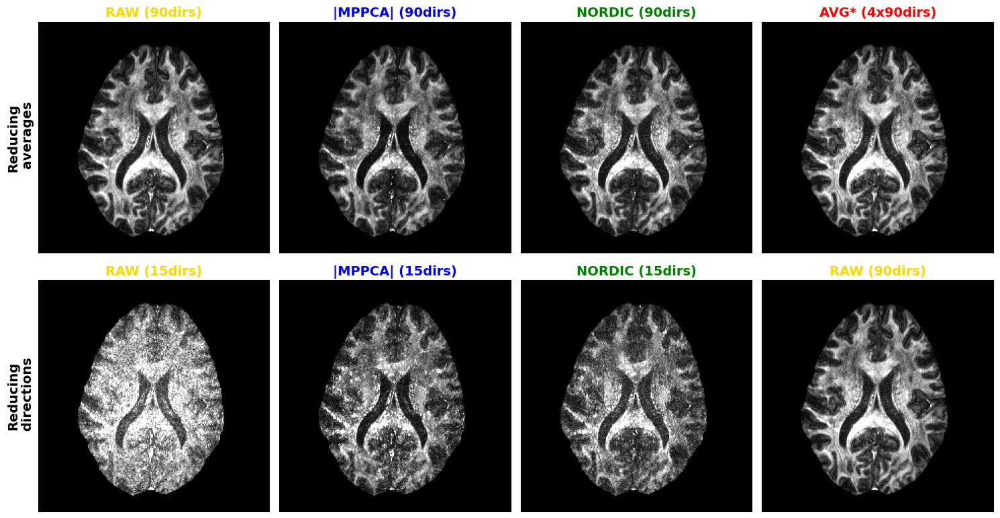

In [9]:
raw = get_data(f'{dataPath}/{dataset}/{rep}/RAW/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
mppca = get_data(f'{dataPath}/{dataset}/{rep}/MPPCA/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
nordic = get_data(f'{dataPath}/{dataset}/{rep}/NORDIC/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
avg_complex = raw = get_data(f'{dataPath}/{dataset}/{rep}/AVG_complex/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
raw_15 = get_data(f'{dataPath}/{dataset}/{rep}/RAW/subsamples/{list_subsamples[0]}/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
mppca_15 = get_data(f'{dataPath}/{dataset}/{rep}/MPPCA/subsamples/{list_subsamples[0]}/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
nordic_15 = get_data(f'{dataPath}/{dataset}/{rep}/NORDIC/subsamples/{list_subsamples[0]}/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')

fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(15, 8), sharex=True, sharey=False)
ax[0,0].imshow(ndimage.rotate(raw[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[0,0].set_title('RAW (90dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[0])
ax[0,1].imshow(ndimage.rotate(mppca[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[0,1].set_title('|MPPCA| (90dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[2])
ax[0,2].imshow(ndimage.rotate(nordic[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[0,2].set_title('NORDIC (90dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[5])
ax[0,3].imshow(ndimage.rotate(avg_complex[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[0,3].set_title('AVG* (4x90dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[6])
ax[1,0].imshow(ndimage.rotate(raw_15[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[1,0].set_title('RAW (15dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[0])
ax[1,1].imshow(ndimage.rotate(mppca_15[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[1,1].set_title('|MPPCA| (15dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[2])
ax[1,2].imshow(ndimage.rotate(nordic_15[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[1,2].set_title('NORDIC (15dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[5])
ax[1,3].imshow(ndimage.rotate(raw[:,:,z[ds]], 90), cmap='gray', vmin=0, vmax=0.8)
ax[1,3].set_title('RAW (90dirs)', fontweight='bold', fontsize=14, color=list_colors_avg[0])

ax[0,0].set_ylabel('Reducing\n averages', fontweight='bold', fontsize=14)
ax[1,0].set_ylabel('Reducing\n directions', fontweight='bold', fontsize=14)
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
plt.tight_layout()


## <a id='toc7_4'></a>[**Fig.14 & Suppl.Fig.9 - Convergence of subsets of denoised data to the AVG\* and  |AVG|**](#toc7_4)

*Caption: **Figure 14. Convergence to the complex multiple-averages (reference) assessed by the Sum of Squared errors (SSE) (left column) and Pearson correlations (right column) in DTI model estimates of subsets from Dataset C (0.9mm)**. The x-axis represents increasing fractions of volumes used to fit the DTI tensor, corresponding to 1/6, 2/6, …6/6 of the whole dataset that contains 93 b=1000 s/mm2 volumes. Top: Fractional Anisotropy correlations. Bottom: Mean Diffusivity.*

To quantify these improvements, we calculated the sum of squared differences and spatial correlation between FA and MD scalar maps in WM obtained from subsets of the original data against the FA and MD maps obtained from the complex average of multiple repeats of the original data. Figure 14 shows the agreement between FA and MD maps in Dataset C (AVG* used as a reference), where MPPCA* and NORDIC converge faster to the reference than the non-denoised data. We can observe that with complex denoising even with ∼ 30 − 35% of the number of volumes we can achieve similar or better agreement to the gold standard average as the full non-denoised dataset. These results also suggest that denoising with one of the complex approach as low as 4/6 of the considered datapoints, one can achieve correlations of ∼ 0.9 against the gold standard; this is equivalent to about 14 minutes of 3T scanning for a 0.9mm isotropic multishell dataset.

We also noticed that approaches that perform denoising in the magnitude domain seem to converge to a different reference compared to complex denoising approaches. We performed the same comparisons using the magnitude average as a reference (Suppl. Figure 9) and demonstrated how magnitude-based methods converge to this reference rather than the complex average. The deviations are more evident when looking at the MD, which is expected to be more affected by the noise floor effects, as described in the previous sections. To confirm this, we assessed agreement in WM regions that are expected to have lower noise floor effects (regions that have low FA, i.e. lower attenuation). Doing so for FA<0.2-0.3, we observed a better agreement of complex denoising methods against the magnitude average (results not shown). Taken together these results demonstrate the feasibility of reducing scan time using denoising approaches and the importance of selecting the correct reference to compare performance against in an unbiased manner.


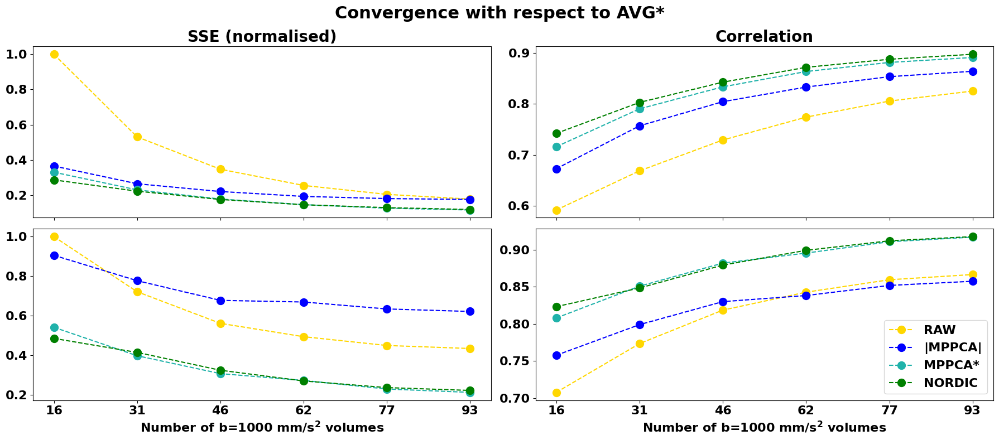

In [19]:
ref = 'AVG_complex'
name_ref = 'AVG*'

ref_FA = get_data(f'{dataPath}/{dataset}/{rep}/{ref}/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
ref_MD = get_data(f'{dataPath}/{dataset}/{rep}/{ref}/analysis/dMRI/processed/data/data.dti/dti_MD.nii.gz')
sse_FA = np.zeros((len(list_methods), len(list_subsamples)))
sse_MD = np.zeros((len(list_methods), len(list_subsamples)))
corr_FA = np.zeros((len(list_methods), len(list_subsamples)))
corr_MD = np.zeros((len(list_methods), len(list_subsamples)))
for m, meth in enumerate(list_methods):
    for n, nvols in enumerate(list_subsamples):
        if n==5:    # The full dataset is the last of nvols, and this directory is in another place
            FA = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
            MD = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/analysis/dMRI/processed/data/data.dti/dti_MD.nii.gz')
        else:
            FA = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/subsamples/{nvols}/analysis/dMRI/processed/data/data.dti/dti_FA.nii.gz')
            MD = get_data(f'{dataPath}/{dataset}/{rep}/{meth}/subsamples/{nvols}/analysis/dMRI/processed/data/data.dti/dti_MD.nii.gz')
        if (m==0 and n==0):
            norm_value_FA = np.sum((ref_FA[mask>0].ravel() - FA[mask>0].ravel())**2)
            norm_value_MD = np.sum((ref_MD[mask>0].ravel() - MD[mask>0].ravel())**2)
        sse_FA[m,n] = np.sum((ref_FA[mask>0].ravel() - FA[mask>0].ravel())**2)/norm_value_FA
        sse_MD[m,n] = np.sum((ref_MD[mask>0].ravel() - MD[mask>0].ravel())**2)/norm_value_MD
        corr_FA[m,n] = np.corrcoef(ref_FA[mask>0].ravel(), FA[mask>0].ravel())[0,1]
        corr_MD[m,n] =np.corrcoef(ref_MD[mask>0].ravel(), MD[mask>0].ravel())[0,1]

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(18, 8), sharex=True, sharey=False)
for i in range(0,len(list_methods)):
    ax[0,0].plot(sse_FA[i,:], linestyle='dashed', marker='o', color=list_colors[i], mec=list_colors[i], markerfacecolor=list_colors[i], markersize=10, label=methods_names[i])
    ax[1,0].plot(sse_MD[i,:], linestyle='dashed', marker='o', color=list_colors[i], mec=list_colors[i], markerfacecolor=list_colors[i], markersize=10, label=methods_names[i])
    ax[0,1].plot(corr_FA[i,:], linestyle='dashed', marker='o', color=list_colors[i], mec=list_colors[i], markerfacecolor=list_colors[i], markersize=10, label=methods_names[i])
    ax[1,1].plot(corr_MD[i,:], linestyle='dashed', marker='o', color=list_colors[i], mec=list_colors[i], markerfacecolor=list_colors[i], markersize=10, label=methods_names[i])


ax[0,0].set_title('SSE (normalised)', fontweight='bold', fontsize=20)
#ax[0,0].set_ylabel('SSE FA (normalised)', fontweight='bold', fontsize=16)
#ax[1,0].set_ylabel('SSE MD (normalised)', fontweight='bold', fontsize=16)
ax[0,1].set_title('Correlation', fontweight='bold', fontsize=20)
#ax[0,1].set_ylabel('Correlation FA', fontweight='bold', fontsize=16)
#ax[1,1].set_ylabel('Correlation MD', fontweight='bold', fontsize=16)
plt.suptitle(f'Convergence with respect to {name_ref}', fontweight='bold', fontsize=22)
for axs in ax[1,:]:
    axs.set_xticks(np.arange(0, len(list_subsamples)))
    axs.set_xticklabels(xlabels, fontsize=16)
    #axs.set_xlabel('Fraction of the full dataset', fontweight='bold', fontsize=16)
    axs.set_xlabel('Number of b=1000 mm/s$^2$ volumes', fontweight='bold', fontsize=16)
for axs in ax.flatten():
    axs.tick_params(axis='y', labelsize=16)
    
plt.legend(methods_names, prop={'size': 16})
plt.tight_layout()
plt.show()